# What are the sources in Sgr B2?

Nazar has cataloged sources in Sgr B2 at 3mm and 1mm.

Theo has calculated masses associated with the Robitaille models.

What can we learn about these sources - and about the models - by putting these together?

In [1]:
ls -lhrt /orange/adamginsburg/sgrb2/NB/catalog*

-rw-r--r-- 1 nbudaiev adamginsburg 103K Nov  4  2021 /orange/adamginsburg/sgrb2/NB/cataloge.dat
-rw-r--r-- 1 nbudaiev adamginsburg  81K Nov  5  2021 /orange/adamginsburg/sgrb2/NB/catalog.dat
-rw-r--r-- 1 nbudaiev adamginsburg  515 Dec 23  2021 /orange/adamginsburg/sgrb2/NB/catalogNc.dat
-rw-r--r-- 1 nbudaiev adamginsburg  29K Dec 23  2021 /orange/adamginsburg/sgrb2/NB/catalogN.dat
-rw-r--r-- 1 nbudaiev adamginsburg  55K Jan 14  2022 /orange/adamginsburg/sgrb2/NB/catalogB6.dat
-rw-r--r-- 1 nbudaiev adamginsburg 111K Jan 15  2022 /orange/adamginsburg/sgrb2/NB/catalogB3.dat

/orange/adamginsburg/sgrb2/NB/catalog:
total 403M
drwxr-xr-x 2 nbudaiev adamginsburg 4.0K Jan 13  2022 transfer/
-rw-r--r-- 1 nbudaiev adamginsburg 182K Feb 15  2022 lowres_cat.txt
-rw-r--r-- 1 nbudaiev adamginsburg  68K Feb 15  2022 catalogB3_review_Nazar.csv
-rw-r--r-- 1 nbudaiev adamginsburg  33K Feb 15  2022 catalogB6_review_Nazar.csv
-rw-r--r-- 1 nbudaiev adamginsburg  65M Feb 15  2022 SgrB2_selfcal_full_TCTE7m_s

In [2]:
!head /orange/adamginsburg/sgrb2/NB/catalog.dat

_idx area_ellipse area_exact flux major_sigma minor_sigma position_angle radius x_cen y_cen
1057 1.313533200898812e-09 3.240740740741259e-09 0.0019125849323050068 2.1930993800054238e-05 1.3752599847731184e-05 63.48958680458629 1.7366870241791395e-05 266.83250843668077 -28.39884115638181
1494 4.839469107678025e-10 1.6975308641978024e-09 0.000950724941097726 1.6560963195811783e-05 6.709871363038961e-06 145.89016704691537 1.0541438834045363e-05 266.8330348166863 -28.398496594887142
1612 1.287117273310565e-09 4.228395061729071e-09 0.0022456074188580213 2.2346706626360607e-05 1.3225334205313756e-05 102.16200361257184 1.719135432482614e-05 266.832796598954 -28.398390017411582
2069 1.834695094677535e-10 6.481481481482518e-10 0.00026876909350960525 8.103984057478077e-06 5.1983723759848015e-06 154.79729699062108 6.490572151961279e-06 266.8314493175509 -28.39813409895524
2317 2.3832539442208018e-09 1.0123456790125076e-08 0.008165838788284764 3.0316162592211568e-05 1.805087077669873e-05 152.18855

In [3]:
from astropy.table import Table
from astropy.io import ascii
import numpy as np

In [4]:
%matplotlib inline
import pylab as pl
#pl.rcParams['figure.facecolor'] = 'white'
pl.style.use('dark_background')
pl.rcParams['font.size'] = 16
pl.rcParams['figure.figsize'] = (8,8)
pl.rcParams['figure.dpi'] = 150

1. Load Nazar's catalog

In [5]:
cat = ascii.read('/orange/adamginsburg/sgrb2/NB/catalog.dat')
cat[:5]

_idx,area_ellipse,area_exact,flux,major_sigma,minor_sigma,position_angle,radius,x_cen,y_cen
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64
1057,1.313533200898812e-09,3.240740740741259e-09,0.0019125849323050068,2.1930993800054238e-05,1.3752599847731184e-05,63.48958680458629,1.7366870241791395e-05,266.83250843668077,-28.39884115638181
1494,4.839469107678025e-10,1.6975308641978024e-09,0.000950724941097726,1.6560963195811783e-05,6.709871363038961e-06,145.89016704691537,1.0541438834045363e-05,266.8330348166863,-28.398496594887142
1612,1.287117273310565e-09,4.228395061729071e-09,0.0022456074188580213,2.2346706626360607e-05,1.3225334205313756e-05,102.16200361257184,1.719135432482614e-05,266.832796598954,-28.398390017411582
2069,1.834695094677535e-10,6.481481481482518e-10,0.00026876909350960525,8.103984057478077e-06,5.1983723759848015e-06,154.79729699062108,6.490572151961279e-06,266.8314493175509,-28.39813409895524
2317,2.3832539442208018e-09,1.0123456790125076e-08,0.008165838788284764,3.0316162592211568e-05,1.805087077669873e-05,152.188552960124,2.3393014628247447e-05,266.8287668855427,-28.397909241070796


2. Load SED models:

In [6]:
from sedfitter.sed import SEDCube

In [7]:
from astropy import units as u

In [8]:
seds = SEDCube.read('/blue/adamginsburg/richardson.t/research/flux/robitaille_models-1.2/spubhmi/flux.fits')

In [9]:
pars = Table.read('/blue/adamginsburg/richardson.t/research/flux/pars/spubhmi_augmented.fits')
len(pars), seds.val.shape

(720000, (720000, 20, 200))

The resolution and typical source size is 400~600 AU:

In [10]:
distance = 8500*u.pc

Text(0.5, 0, 'Source size [au]')

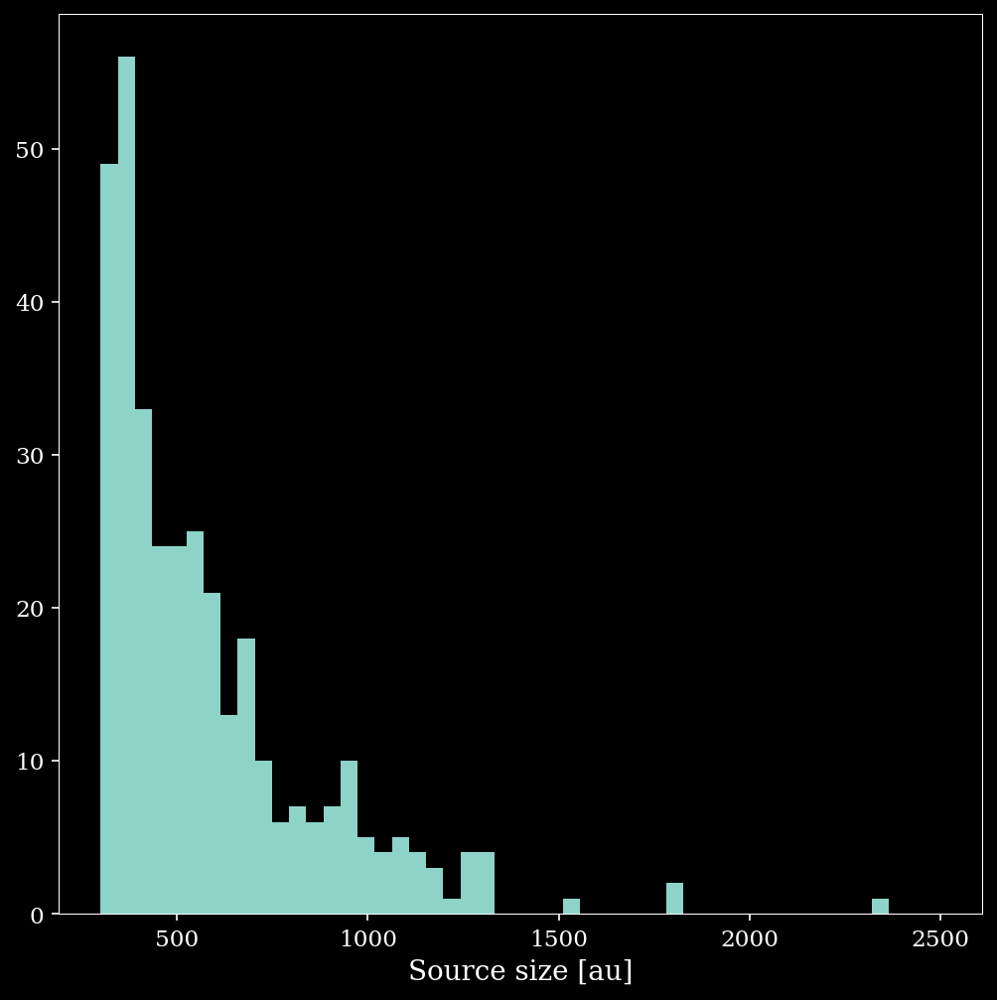

In [11]:
pl.hist((cat['major_sigma']*u.deg * distance).to(u.au, u.dimensionless_angles()).value, bins = np.linspace(300,2500));
pl.xlabel("Source size [au]")

So we adopt Aperture 4 at 700 AU:

In [12]:
seds.apertures[4]

<Quantity 695.19279618 AU>

Aperture 3 might also be appropriate:

In [13]:
seds.apertures[3]

<Quantity 428.13323987 AU>

but we're going with 4.

Load Theo's augmented tables (for one geometry):

Add the 1mm and 3mm fluxes to the table:

In [14]:
pars['f1mm'] = seds.val[:,4,20].value # 20, 4 = 1300 micron, 700 AU
pars['f3mm'] = seds.val[:,4,6].value # 6, 4 = 3300 micron, 700 AU
alpha_1mm3mm = np.log(pars['f1mm']/pars['f3mm']) / np.log(seds.wav[6]/seds.wav[20])

In [15]:
# spubsmi - star, passive disk, flattened envelope, bipolar cavities, inner radius determined by sublimation, ambient medium, interstellar dust
pars_spubsmi = Table.read('/blue/adamginsburg/richardson.t/research/flux/pars/spubsmi_augmented.fits')
seds_spubsmi = SEDCube.read('/blue/adamginsburg/richardson.t/research/flux/robitaille_models-1.2/spubsmi/flux.fits')
pars_spubsmi['f1mm'] = seds_spubsmi.val[:,4,20].value # 20, 4 = 1300 micron, 700 AU
pars_spubsmi['f3mm'] = seds_spubsmi.val[:,4,6].value # 6, 4 = 3300 micron, 700 AU
alpha_1mm3mm_spubsmi = np.log(pars_spubsmi['f1mm']/pars_spubsmi['f3mm']) / np.log(seds_spubsmi.wav[6]/seds_spubsmi.wav[20])

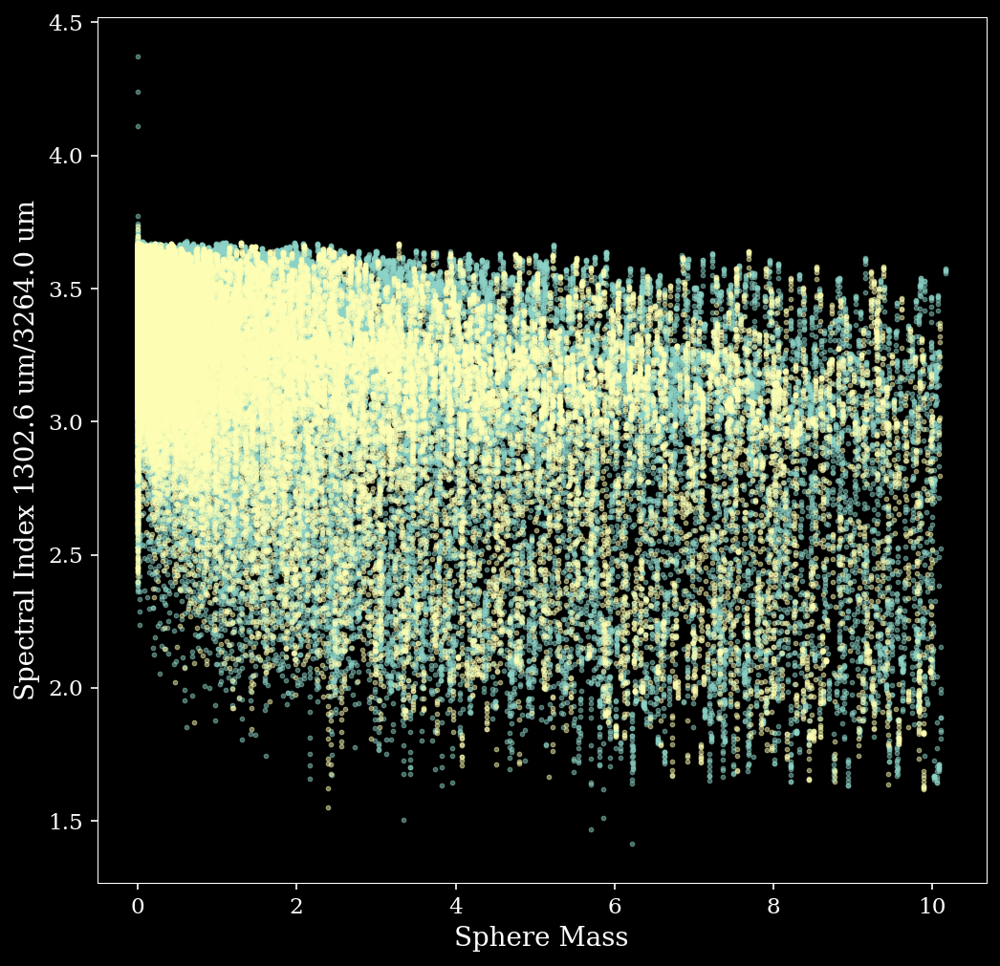

In [16]:
pl.scatter(pars['Sphere Masses'][:,4], alpha_1mm3mm, s=5, alpha=0.5)
pl.scatter(pars_spubsmi['Sphere Masses'][:,4], alpha_1mm3mm_spubsmi, s=5, alpha=0.5)
pl.xlabel("Sphere Mass");
pl.ylabel(f"Spectral Index {seds.wav[20]:0.1f}/{seds.wav[6]:0.1f}");

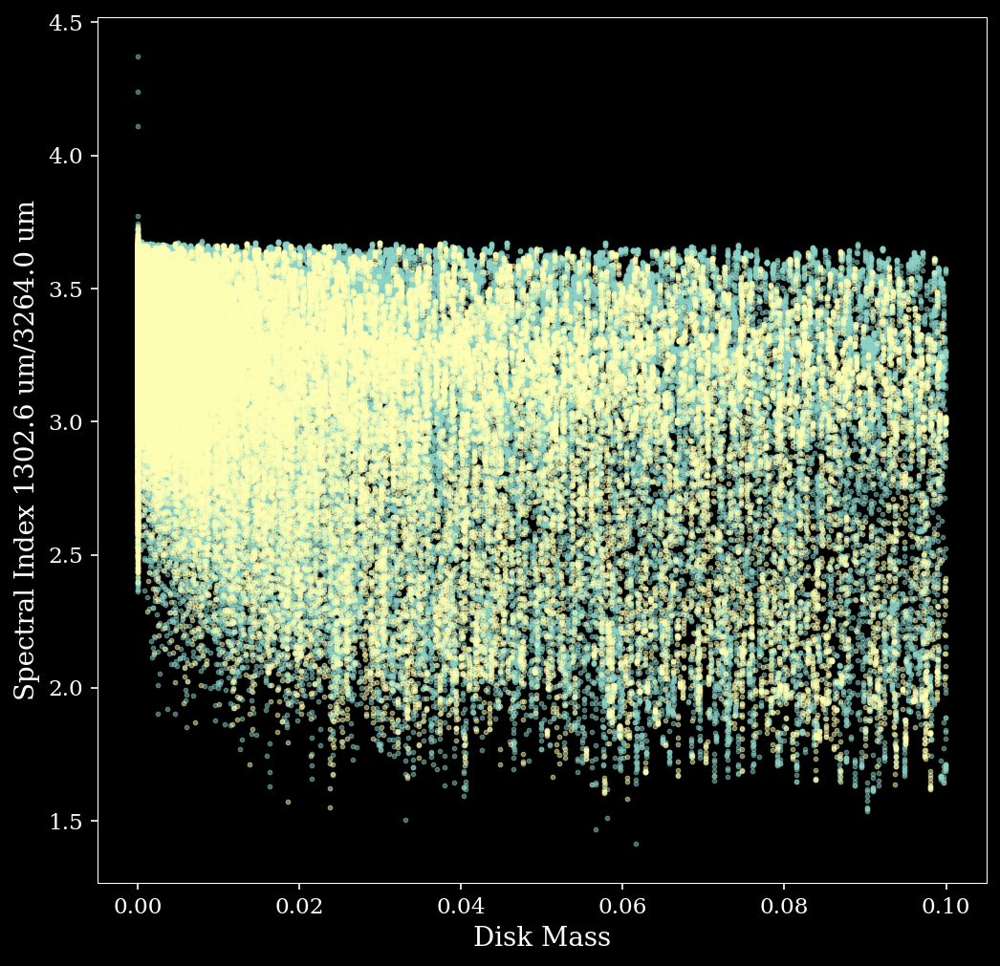

In [17]:
pl.scatter(pars['disk.mass'], alpha_1mm3mm, s=5, alpha=0.5)
pl.scatter(pars_spubsmi['disk.mass'], alpha_1mm3mm_spubsmi, s=5, alpha=0.5)
pl.xlabel("Disk Mass");
pl.ylabel(f"Spectral Index {seds.wav[20]:0.1f}/{seds.wav[6]:0.1f}");

Check out the brightest few sources:

In [18]:
cat.sort('flux')
cat[-5:]

_idx,area_ellipse,area_exact,flux,major_sigma,minor_sigma,position_angle,radius,x_cen,y_cen
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64
1188,1.053711268182427e-09,4.6913580246921085e-09,0.2197128471844116,1.7404174315401504e-05,1.3901775291045123e-05,146.64370925887698,1.5554707340830647e-05,266.83378457989755,-28.38437752337478
1152,2.8969907594111413e-09,1.5216049382718484e-08,0.34536647584576863,2.7145779611885426e-05,2.4504556987884608e-05,-177.2473388056401,2.579138041051705e-05,266.83421924857316,-28.384546953640903
1216,3.1234625507558684e-09,1.8240740740743657e-08,0.3692608007853965,2.8720857769366244e-05,2.497128902532465e-05,101.7733745878128,2.6780530995745503e-05,266.83452616036783,-28.384197956556996
1171,1.2089879945938579e-09,4.351851851852548e-09,0.4800295738559199,2.647396998817553e-05,1.0485882344120226e-05,146.06898759422154,1.6661420542011972e-05,266.8338959779539,-28.3844714214922
1128,2.421508566282459e-09,5.524691358025575e-09,0.8549845184749251,3.176475960540478e-05,1.7504209442485433e-05,71.65807148684902,2.3580012829156944e-05,266.834018464217,-28.384669195184397


Then, find all the models within ~10% of the predicted flux at 3mm (this catalog is, afaik, a 3mm catalog):

In [19]:
from tqdm.notebook import tqdm

In [20]:
for parameter in ('Model Luminosity', 'disk.mass', 'Sphere Masses', 'Line-of-Sight Masses', 'Sphere Weighted Temperatures', 'Line-of-Sight Weighted Temperatures', 'f1mm', 'f3mm'):
    cat[parameter] = np.nan
    cat[f'{parameter} std'] = np.nan
cat['nmatches'] = 0
    
for row in tqdm(cat):
    # look for models with a 10% match to the 3mm flux
    f3mm = pars['f3mm'] / 8.5**2
    f1mm = pars['f1mm'] / 8.5**2
    pars_match = np.abs((f3mm - row['flux']) / row['flux']) < 0.1
    nmatches = pars_match.sum()
    row['nmatches'] = nmatches
    for parameter in ('Model Luminosity', 'disk.mass', 'f1mm', 'f3mm'):
        row[parameter] = pars[parameter][pars_match].mean()
        row[f'{parameter} std'] = pars[parameter][pars_match].std()
    for parameter in ('Sphere Masses', 'Line-of-Sight Masses', 'Sphere Weighted Temperatures', 'Line-of-Sight Weighted Temperatures'):
        row[parameter] = pars[parameter][pars_match,4].mean()
        row[f'{parameter} std'] = pars[parameter][pars_match,4].std()


  0%|          | 0/421 [00:00<?, ?it/s]

Then let's make some plots:

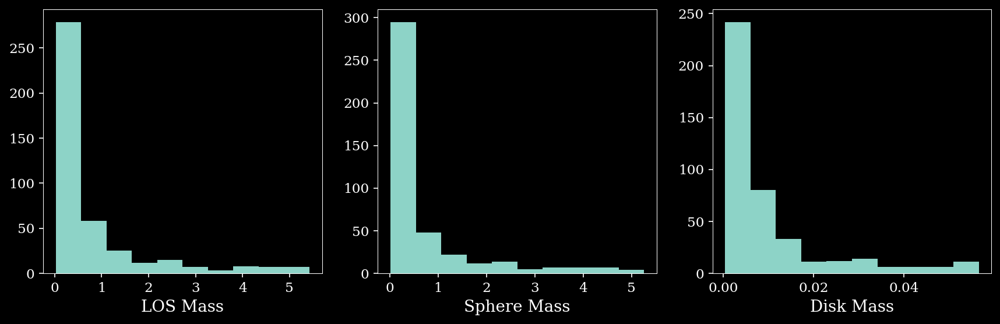

In [21]:
pl.figure(figsize=(14,4))
pl.subplot(1,3,1).hist(cat['Line-of-Sight Masses']); pl.xlabel("LOS Mass")
pl.subplot(1,3,2).hist(cat['Sphere Masses']); pl.xlabel("Sphere Mass")
pl.subplot(1,3,3).hist(cat['disk.mass']); pl.xlabel("Disk Mass");

In [22]:
cat['Line-of-Sight Masses'].sum(), cat['Sphere Masses'].sum(), cat['disk.mass'].sum()

(326.95509279770266, 297.7877603426876, 4.104519205369105)

Total ~300-350 Msun in the inner cores.

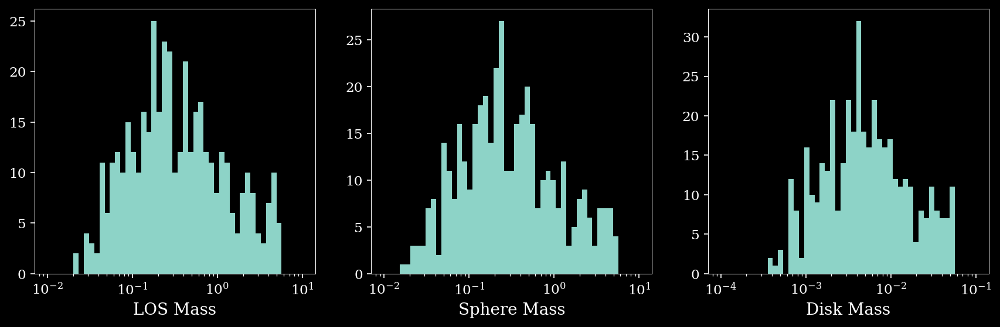

In [23]:
pl.figure(figsize=(14,4))
pl.subplot(1,3,1).hist(cat['Line-of-Sight Masses'], bins=np.logspace(-2,1)); pl.xlabel("LOS Mass"); pl.xscale('log')
pl.subplot(1,3,2).hist(cat['Sphere Masses'], bins=np.logspace(-2,1)); pl.xlabel("Sphere Mass"); pl.xscale('log')
pl.subplot(1,3,3).hist(cat['disk.mass'], bins=np.logspace(-4,-1)); pl.xlabel("Disk Mass"); pl.xscale('log')

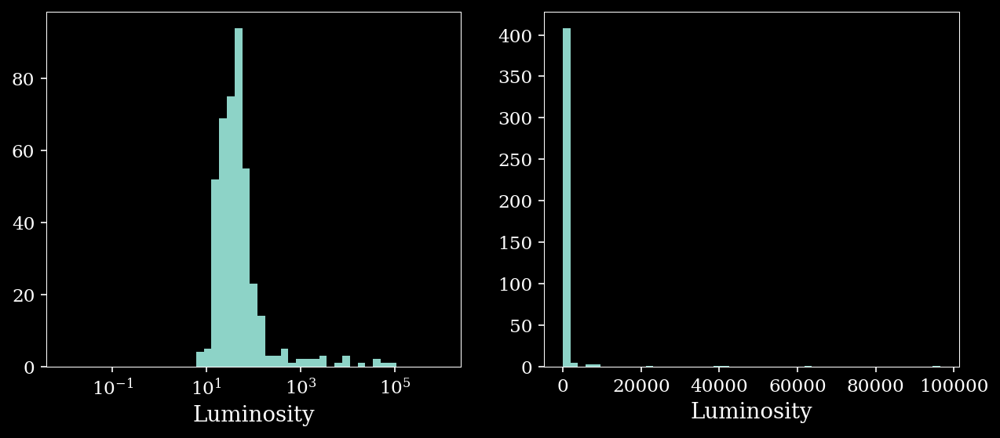

In [24]:
pl.figure(figsize=(10,4))
pl.subplot(1,2,1).hist(cat['Model Luminosity'], bins=np.logspace(-2,6)); pl.xlabel("Luminosity"); pl.xscale('log')
pl.subplot(1,2,2).hist(cat['Model Luminosity'], bins=50); pl.xlabel("Luminosity");

The histogram is probably the key takeaway, but we should look at some correlations and check out the "errors" too:

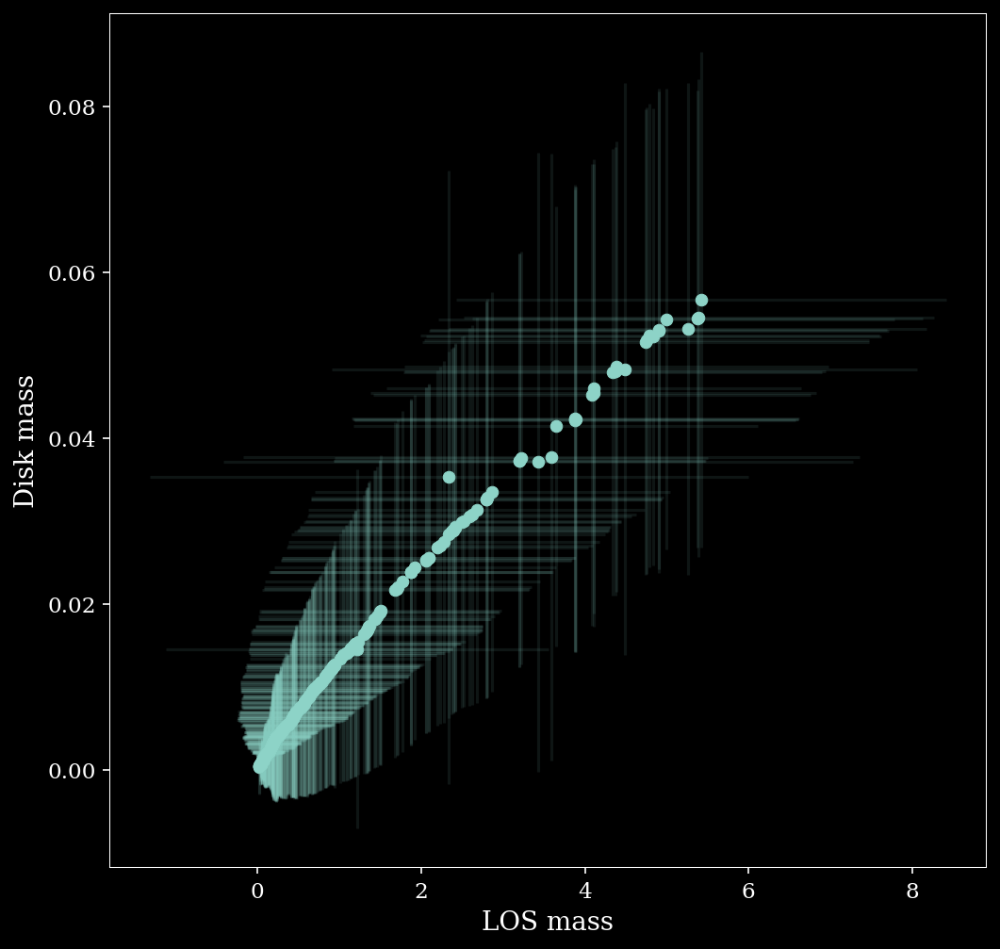

In [25]:
pl.errorbar(cat['Line-of-Sight Masses'], cat['disk.mass'], xerr=cat['Line-of-Sight Masses std'], yerr=cat['disk.mass std'], linestyle='none', alpha=0.1)
pl.scatter(cat['Line-of-Sight Masses'], cat['disk.mass'],)
pl.xlabel("LOS mass")
pl.ylabel("Disk mass");

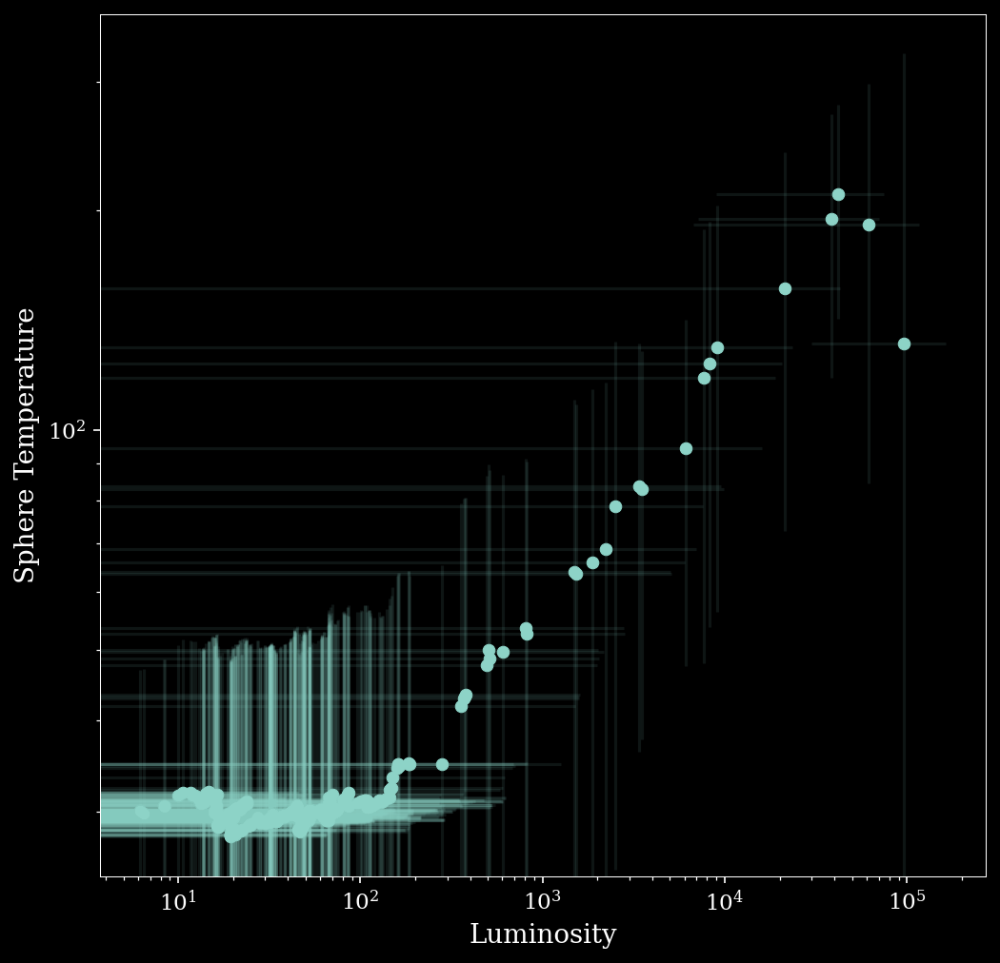

In [26]:
pl.loglog()
pl.errorbar(cat['Model Luminosity'], cat['Sphere Weighted Temperatures'], xerr=cat['Model Luminosity std'], yerr=cat['Sphere Weighted Temperatures std'], linestyle='none', alpha=0.1)
pl.scatter(cat['Model Luminosity'], cat['Sphere Weighted Temperatures'], )
pl.xlabel("Luminosity")
pl.ylabel("Sphere Temperature");

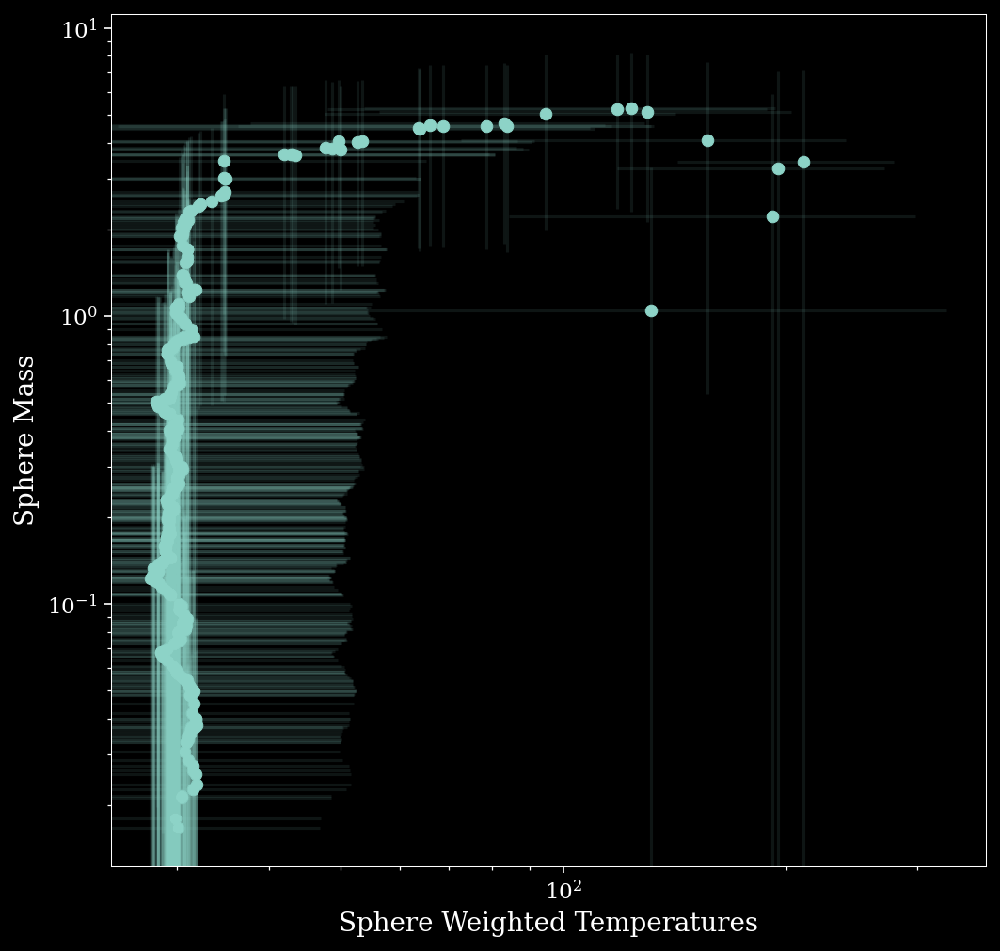

In [27]:
pl.loglog()
pl.errorbar(cat['Sphere Weighted Temperatures'], cat['Sphere Masses'], xerr=cat['Sphere Weighted Temperatures std'], yerr=cat['Sphere Masses std'], linestyle='none', alpha=0.1)
pl.scatter(cat['Sphere Weighted Temperatures'], cat['Sphere Masses'], )
pl.xlabel("Sphere Weighted Temperatures")
pl.ylabel("Sphere Mass");

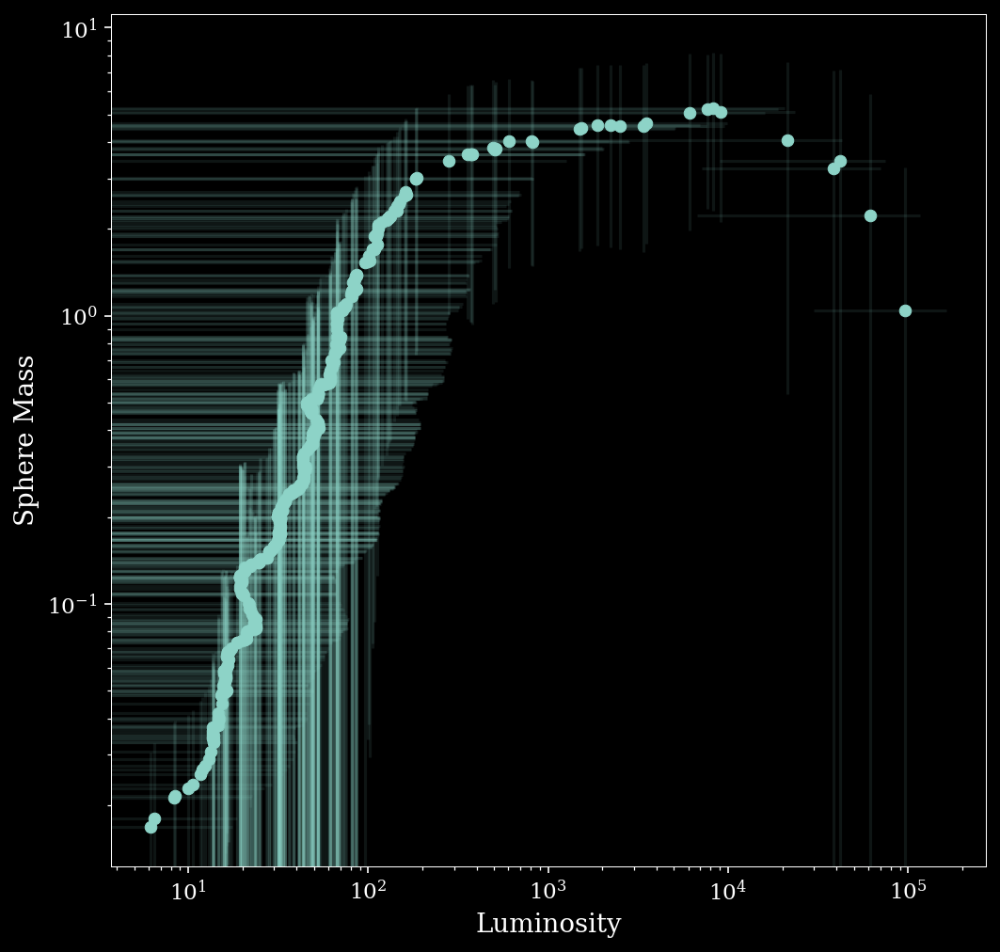

In [28]:
pl.loglog()
pl.errorbar(cat['Model Luminosity'], cat['Sphere Masses'], xerr=cat['Model Luminosity std'], yerr=cat['Sphere Masses std'], linestyle='none', alpha=0.1)
pl.scatter(cat['Model Luminosity'], cat['Sphere Masses'], )
pl.xlabel("Luminosity")
pl.ylabel("Sphere Mass");

Text(0, 0.5, 'Sphere Mass')

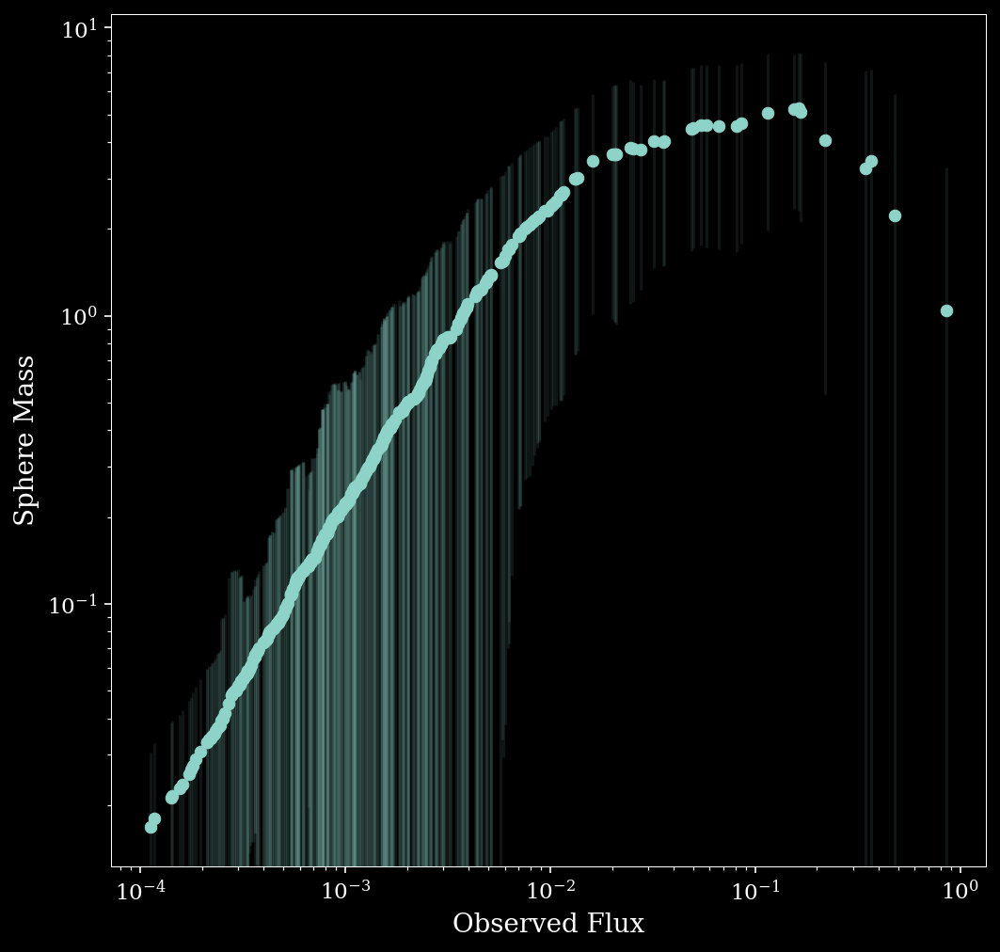

In [29]:
pl.loglog()
pl.errorbar(cat['flux'], cat['Sphere Masses'], yerr=cat['Sphere Masses std'], linestyle='none', alpha=0.1)
pl.scatter(cat['flux'], cat['Sphere Masses'], )
pl.xlabel("Observed Flux")
pl.ylabel("Sphere Mass")

This leaves open some questions:

* What's going on in the last plot - why does the same flux produce a turnover in mass at some point?  This is probably just a limitation in the models.
* What are the real measurements - do we have mass uncertainties we can use?
* The model grid favors high temperatures only for very high masses and luminosities.  Is that OK?  Maybe?
* What uncertainties should we include for the various estimates (since there is a wide range of models that matches the data plausibly)?

In [30]:
# New addition 10/25/2022
# spectral indices

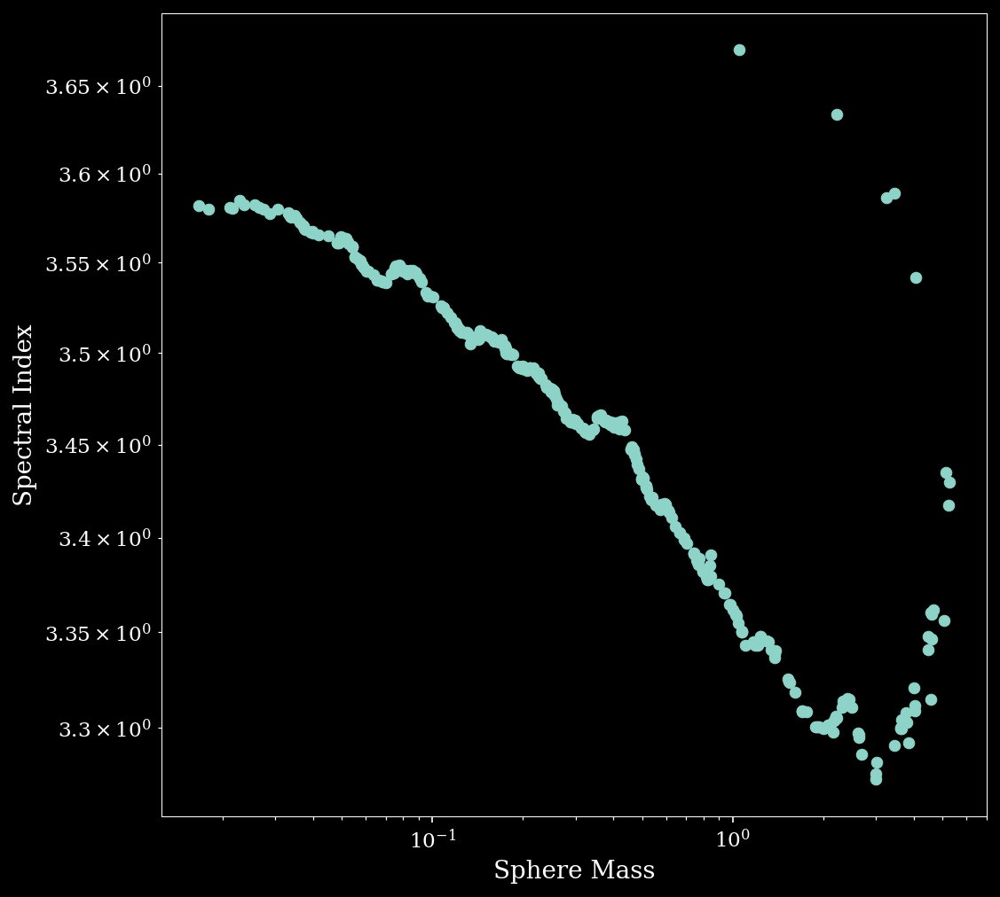

In [31]:
pl.loglog()
#pl.errorbar(cat['flux'], cat['Sphere Masses'], yerr=cat['Sphere Masses std'], linestyle='none', alpha=0.1)
alpha = np.log(cat['f1mm'] / cat['f3mm']) / np.log(226 / 93)
pl.scatter(cat['Sphere Masses'], alpha)
pl.ylabel("Spectral Index")
pl.xlabel("Sphere Mass");

# Compare to 2018 paper

In [32]:
ls /orange/adamginsburg/sgrb2/2013.1.00269.S/SgrB2_ALMA_3mm_Mosaic/tables/continuum_photometry_withSIMBAD_andclusters.ipac

/orange/adamginsburg/sgrb2/2013.1.00269.S/SgrB2_ALMA_3mm_Mosaic/tables/continuum_photometry_withSIMBAD_andclusters.ipac


In [33]:
tbl = Table.read('/orange/adamginsburg/sgrb2/2013.1.00269.S/SgrB2_ALMA_3mm_Mosaic/tables/continuum_photometry_withSIMBAD_andclusters.ipac', format='ascii.ipac')

In [34]:
tbl

name,RA,Dec,peak,sum,alpha,alphaerror,npix,beam_area,bgmad,color,peak_mass_20K,peak_col_20K,peak_mass_40K,peak_col_40K,peak_90GHz,sum_90GHz,bgmad_90GHz,peak_100GHz,sum_100GHz,bgmad_100GHz,peak_K,SIMBAD_ID,SIMBAD_OTYPE,Caswell_Name,Caswell_V_CH3OH,Caswell_matchdistance,McGrath_V_H2O,McGrath_matchdistance,Muno_xray_ID,Muno_xray_Counts,Muno_xray_matchdistance,nn11,Cluster,Classification
,deg,deg,Jy / beam,Jy / beam,,,,sr,Jy / beam,,solMass,1 / cm2,solMass,1 / cm2,,,,,,,K,,,,km / s,arcsec,km / s,arcsec,,1 / (cm2 s),arcsec,deg,,
str16,float64,float64,float64,float64,float64,float64,float64,float64,float64,str6,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str24,str11,str11,float64,float64,float64,float64,str15,float64,float64,float64,str2,str19
core_236_f10.303,266.833775,-28.3843691667,0.885124623775,14.486871589,1.12441766262,0.0147657636553,49.0,6.68830907334e-12,0.0194553674091,green,nan,nan,nan,nan,0.902322590351,15.4780611731,0.0166451427167,0.843389332294,13.1229821723,0.0181659500054,464.099673576,[BJ84] F1b,HII,-,nan,nan,75.3000030518,0.0950129200203,-,nan,nan,0.000683820973871,M,S\_\_W HII
core_177_B,266.832991667,-28.3841775,0.14727859199,4.3441668693,0.47206518054,0.0113475443795,52.0,6.68830907334e-12,0.00393258797177,green,nan,nan,nan,nan,0.158725559711,4.74258879945,0.00328941884066,0.136955916882,3.86906885542,0.00438450306714,77.2229634467,NAME Sgr B2 HII B,HII,-,nan,nan,nan,nan,-,nan,nan,0.00114712851652,M,S\_\_\_ HII
core_179_f10.38,266.8341375,-28.3851869444,0.126577079296,3.2256636247,1.64511275291,0.0130346184596,52.0,6.68830907334e-12,0.00929706025088,green,nan,nan,nan,nan,0.125556603074,3.16385250911,0.00682031209974,0.119899623096,3.01119581051,0.00878404698079,66.36848598,[GCD95] F10.38,HII,-,nan,nan,72.5999984741,0.158038911185,-,nan,nan,0.000759298382955,M,S\_\_W HII
core_171_K3,266.832895833,-28.3714502778,0.185295373201,5.14789291471,1.35723757744,0.0232740361243,47.0,6.68830907334e-12,0.024765808005,green,nan,nan,nan,nan,0.182438105345,5.09412941337,0.0207359671458,0.17622025311,4.74555544928,0.0218163426036,97.1564002492,NAME Sgr B2 HII K3,HII,-,nan,nan,110.5,0.494064880018,-,nan,nan,0.00190256877596,N,S\_\_W HII
core_234_f4,266.834225,-28.3845497222,1.09173321724,16.306052275,0.834140121937,0.000541811576113,50.0,6.68830907334e-12,0.0228364193588,green,nan,nan,nan,nan,1.15987539291,17.7914216518,0.0167874059552,0.991170406342,14.4967590235,0.0207185886372,572.431289497,[BJ84] F4b,HII,-,nan,nan,88.8000030518,0.61498120973,-,nan,nan,0.000595412547493,M,S\_\_W HII
core_252,266.832758333,-28.3703244444,0.0824053287506,2.9061017707,1.85889053345,0.0776091590524,52.0,6.68830907334e-12,0.0154760879855,green,nan,nan,nan,nan,0.0809981524944,2.83221183717,0.0143276869751,0.0782916843891,2.76634648815,0.0135479268535,43.2077982544,[QSR2011] Sgr B2(N)-SMA2,denseCore,-,nan,nan,56.5,0.18235033652,-,nan,nan,0.00239282519822,N,S\_\_W denseCore
core_170,266.832895833,-28.3704502778,0.0919992998242,2.82919492759,1.69137728214,0.0822939202189,49.0,6.68830907334e-12,0.022519440388,green,nan,nan,nan,nan,0.0896335765719,2.78524511121,0.020985834641,0.0902027413249,2.65058699436,0.0203943150008,48.2382298162,[MM97] Core h,PartofCloud,-,nan,nan,75.3000030518,0.32728194028,-,nan,nan,0.00245626569281,N,S\_\_W PartofCloud
core_173_K1,266.832416667,-28.3724286111,0.0922067090869,2.6825963147,0.584139823914,0.0344367139041,52.0,6.68830907334e-12,0.00441885724151,green,nan,nan,nan,nan,0.100080750883,2.89882896096,0.00272246018619,0.0835085660219,2.35433083028,0.00461217968707,48.3469812491,NAME Sgr B2 HII K1,HII,-,nan,nan,nan,nan,-,nan,nan,0.00198416759354,N,S\_\_\_ HII


Text(0, 0.5, 'Sum')

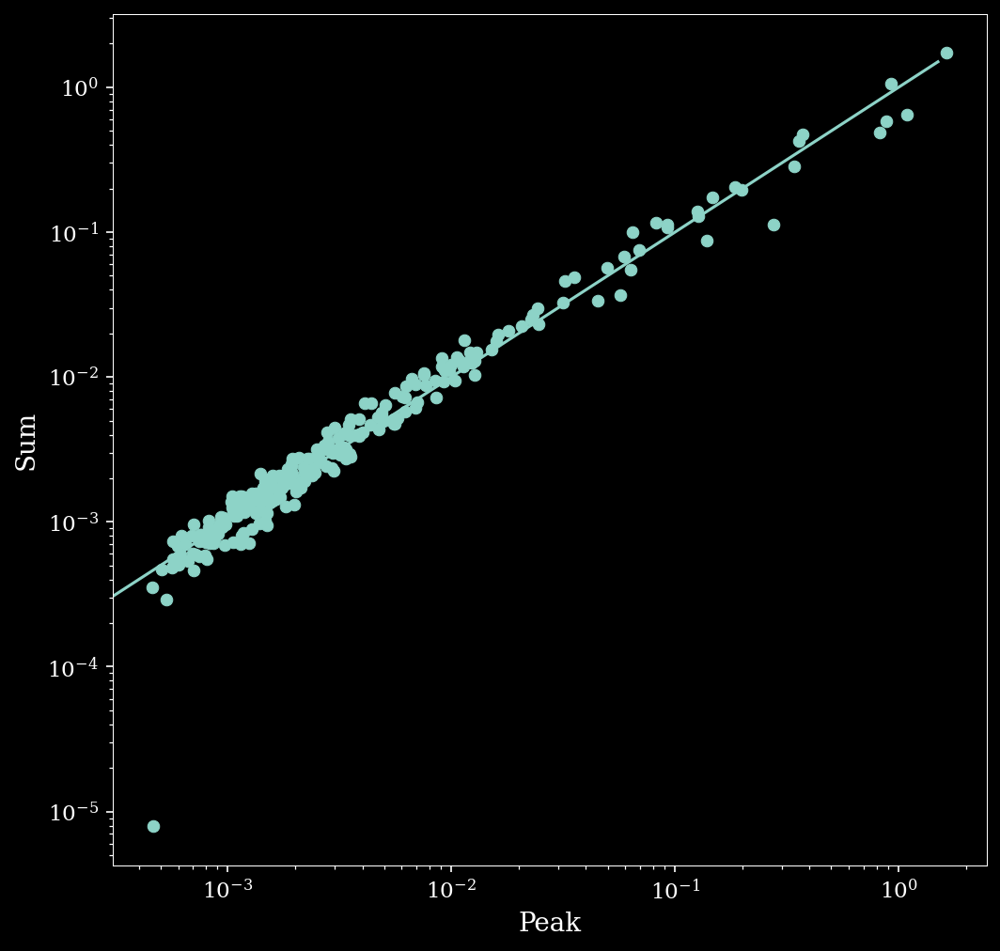

In [35]:
# 50 is a guess at ppbeam
pl.scatter(tbl['peak'], tbl['sum']/25)
pl.plot([0,1.5], [0,1.5])
pl.loglog()
pl.xlabel("Peak")
pl.ylabel("Sum")

[]

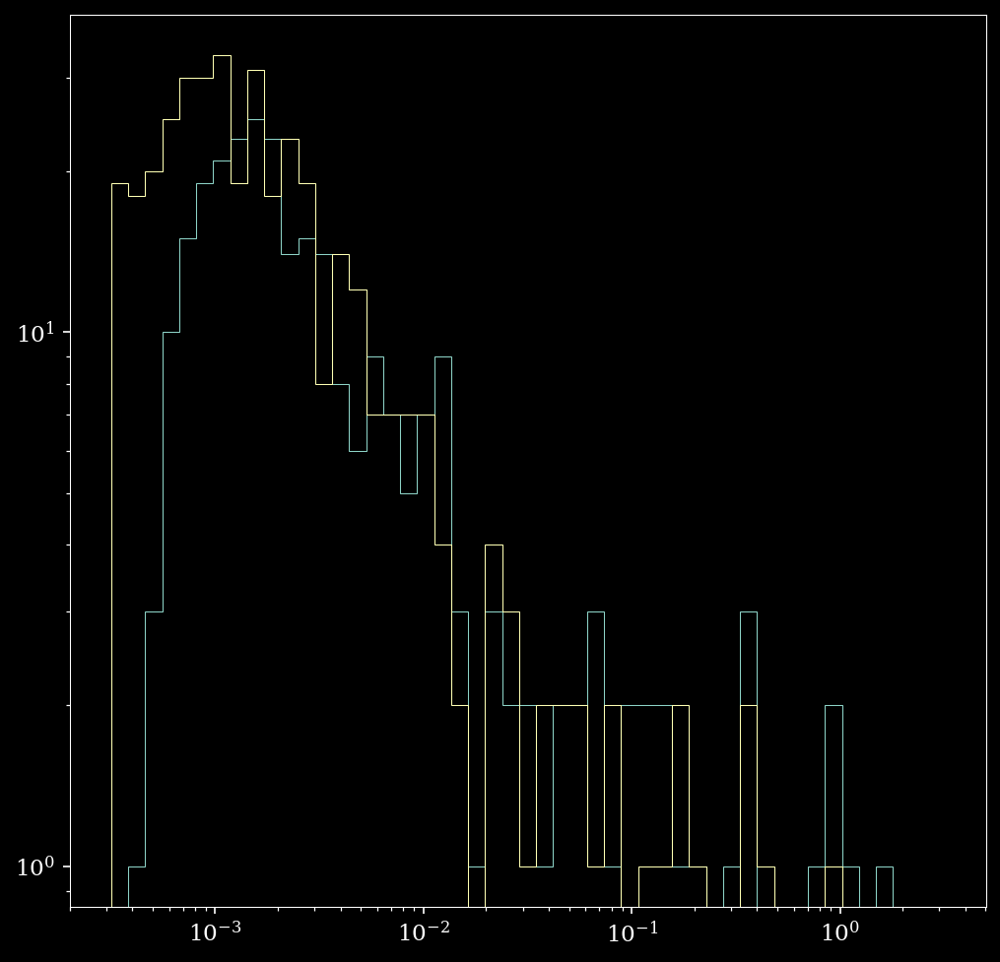

In [36]:
pl.hist(tbl['peak'], log=True, bins=np.logspace(-3.5, 0.5), histtype='step')
pl.hist(cat['flux'], log=True, bins=np.logspace(-3.5, 0.5), histtype='step')
pl.loglog()

Text(0, 0.5, 'Cumulative fraction of sources')

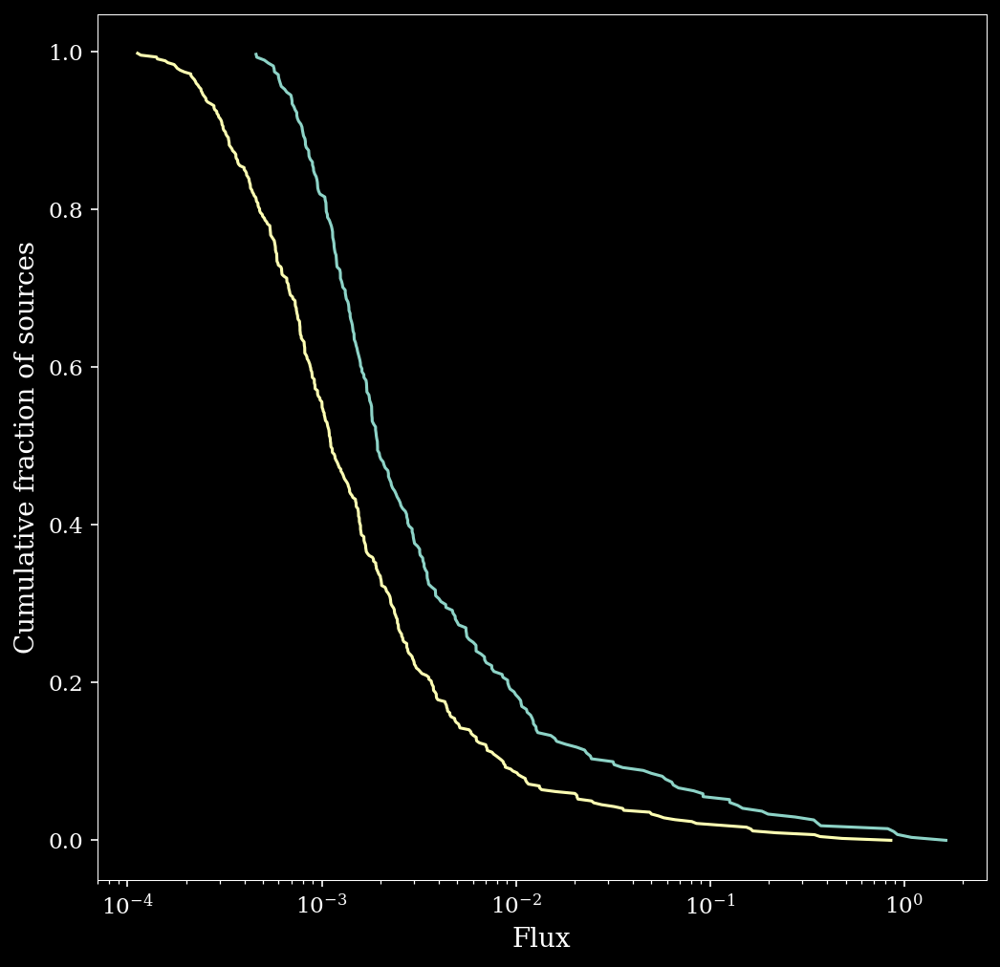

In [37]:
pk = tbl['peak']
pk = pk[pk>0]
pl.plot(sorted(pk), (np.arange(len(pk))/len(pk))[::-1])
pl.plot(sorted(cat['flux']), (np.arange(len(cat))/len(cat))[::-1])
pl.semilogx()
pl.xlabel("Flux")
pl.ylabel("Cumulative fraction of sources")

Text(0, 0.5, 'Cumulative fraction of sources')

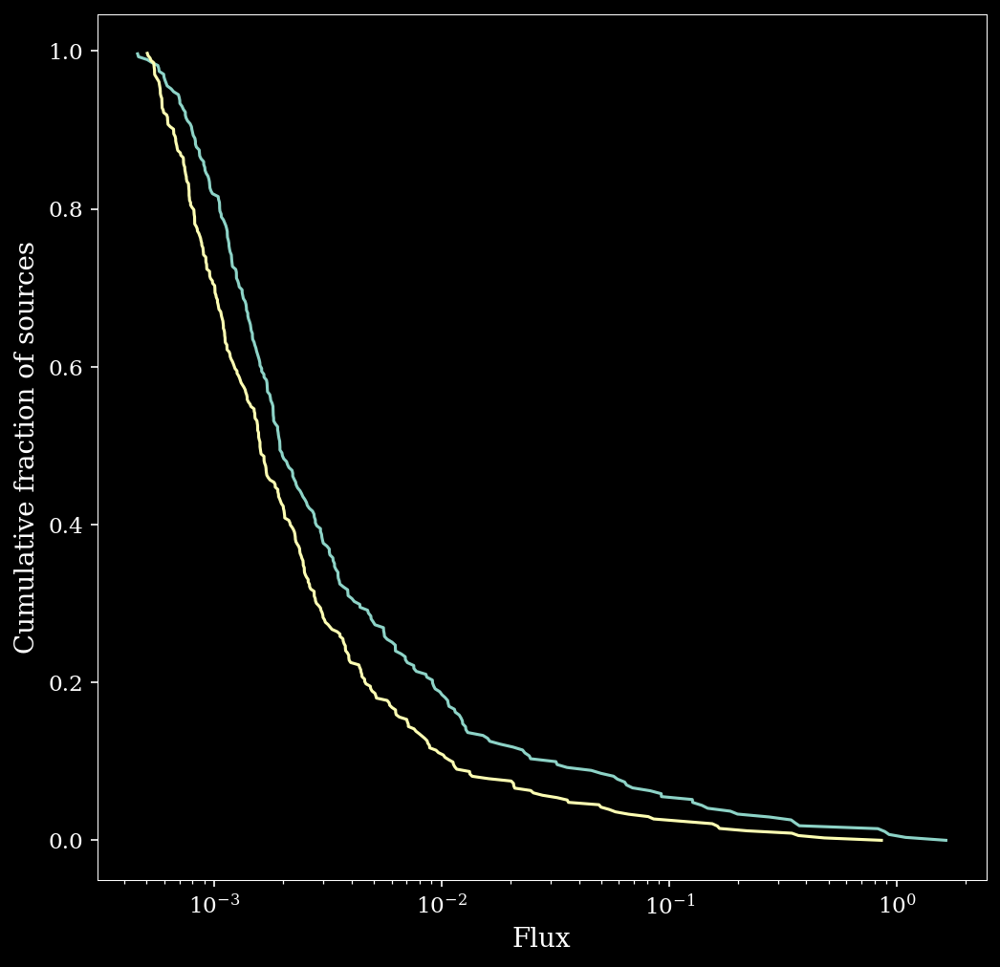

In [38]:
pk = tbl['peak']
pk = pk[pk>0]
cf = cat['flux']
cf = cf[cf>5e-4]
pl.plot(sorted(pk), (np.arange(len(pk))/len(pk))[::-1])
pl.plot(sorted(cf), (np.arange(len(cf))/len(cf))[::-1])
pl.semilogx()
pl.xlabel("Flux")
pl.ylabel("Cumulative fraction of sources")

[]

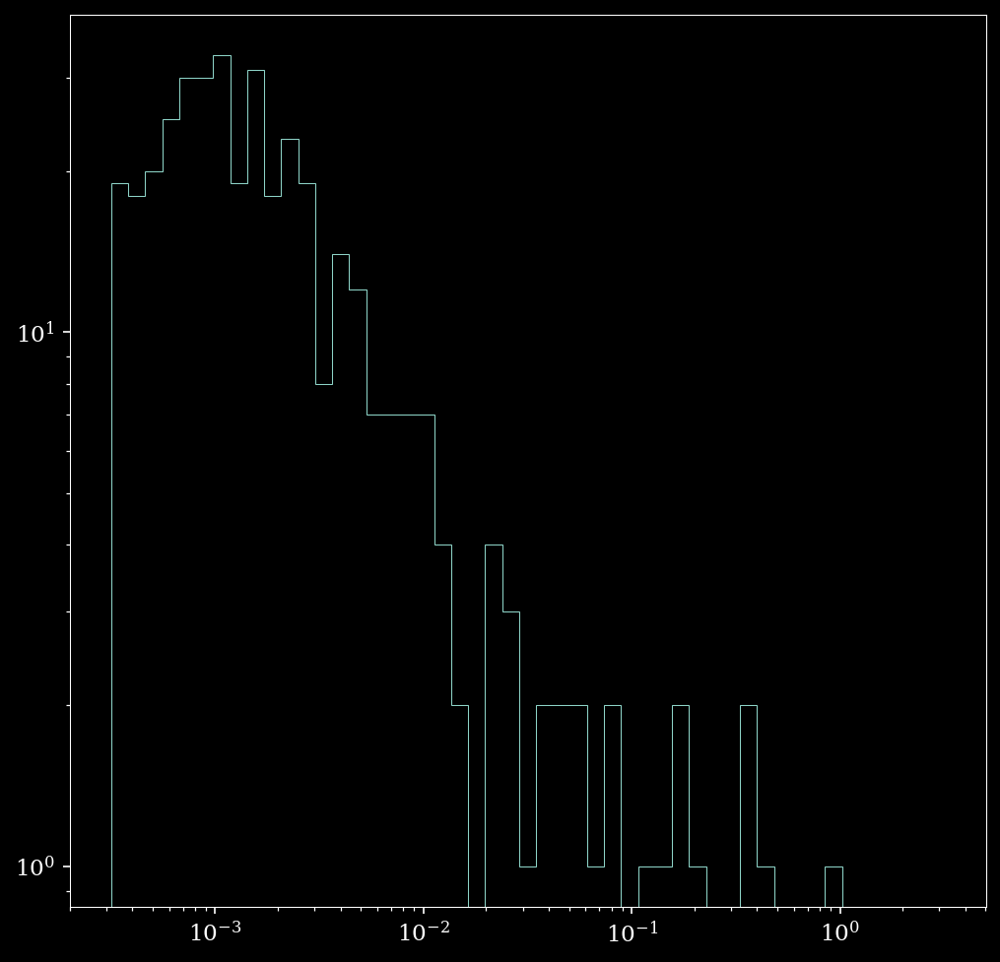

In [39]:
pl.hist(cat['flux'], log=True, bins=np.logspace(-3.5, 0.5), histtype='step')
pl.loglog()

In [40]:
pars

MODEL_NAME,star.radius,star.temperature,disk.mass,disk.rmax,disk.beta,disk.p,disk.h100,envelope.rho_0,envelope.rc,cavity.power,cavity.theta_0,cavity.rho_0,disk.rmin,envelope.rmin,ambient.density,ambient.temperature,scattering,inclination,Model Luminosity,Line-of-Sight Masses,Sphere Masses,Outer Radius,Line-of-Sight Weighted Temperatures,Sphere Weighted Temperatures,Disk Minimum Q,f1mm,f3mm
,,,,,,,,,,,,,,,,,,,solLum,,,,,,,,
bytes20,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64,float64[20],float64[20],float64,float64[20],float64[20],float64,float32,float32
0001EHII_01,35.2,20690.0,0.001522,169.6,1.018,-0.02565,3.247,2.271e-19,169.6,1.043,6.03,9.729e-21,6.215,6.215,1e-23,10.0,1,0.1293254106880204,204560.11910696144,0.00030176593291674847 .. 18.408584635153005,0.0 .. --,112380.19954140943,255.99905565632412 .. --,-- .. --,--,nan,nan
0001EHII_02,35.2,20690.0,0.001522,169.6,1.018,-0.02565,3.247,2.271e-19,169.6,1.043,6.03,9.729e-21,6.215,6.215,1e-23,10.0,1,18.169483896143635,204560.11910696144,0.0002955606369210387 .. 18.40858463515266,0.0 .. --,112380.19954140943,273.79418375230654 .. --,-- .. --,--,nan,nan
0001EHII_03,35.2,20690.0,0.001522,169.6,1.018,-0.02565,3.247,2.271e-19,169.6,1.043,6.03,9.729e-21,6.215,6.215,1e-23,10.0,1,29.33578891922566,204560.11910696144,0.00033978651209562243 .. 18.40858463515242,0.0 .. --,112380.19954140943,258.6304835627172 .. --,-- .. --,--,nan,nan
0001EHII_04,35.2,20690.0,0.001522,169.6,1.018,-0.02565,3.247,2.271e-19,169.6,1.043,6.03,9.729e-21,6.215,6.215,1e-23,10.0,1,32.800605964317285,204560.11910696144,0.0003334894763767727 .. 18.40858463515171,0.0 .. --,112380.19954140943,266.0107477154561 .. --,-- .. --,--,nan,nan
0001EHII_05,35.2,20690.0,0.001522,169.6,1.018,-0.02565,3.247,2.271e-19,169.6,1.043,6.03,9.729e-21,6.215,6.215,1e-23,10.0,1,42.327255742673586,204560.11910696144,0.0003407608375200946 .. 18.408584635151236,0.0 .. --,112380.19954140943,276.2026712453796 .. --,-- .. --,--,nan,nan
0001EHII_06,35.2,20690.0,0.001522,169.6,1.018,-0.02565,3.247,2.271e-19,169.6,1.043,6.03,9.729e-21,6.215,6.215,1e-23,10.0,1,52.498257656374726,204560.11910696144,0.00037613944000721713 .. 18.4085846351514,0.0 .. --,112380.19954140943,276.95658614336304 .. --,-- .. --,--,nan,nan
0001EHII_07,35.2,20690.0,0.001522,169.6,1.018,-0.02565,3.247,2.271e-19,169.6,1.043,6.03,9.729e-21,6.215,6.215,1e-23,10.0,1,65.52340402860548,204560.11910696144,0.00043645887685494995 .. 18.40858463515208,0.0 .. --,112380.19954140943,286.398030086275 .. --,-- .. --,--,nan,nan
0001EHII_08,35.2,20690.0,0.001522,169.6,1.018,-0.02565,3.247,2.271e-19,169.6,1.043,6.03,9.729e-21,6.215,6.215,1e-23,10.0,1,73.9444052257538,204560.11910696144,0.0004958664279791894 .. 18.408584635151982,0.0 .. --,112380.19954140943,293.0961182347885 .. --,-- .. --,--,nan,nan


In [47]:
geometries = [
's-pbhmi',
's-pbsmi',
'sp--h-i',
's-p-hmi',
'sp--hmi',
'sp--s-i',
's-p-smi',
'sp--smi',
'spubhmi',
'spubsmi',
'spu-hmi',
'spu-smi',
#'s---s-i',
#'s---smi',
's-ubhmi',
's-ubsmi',
's-u-hmi',
's-u-smi',
]

s-pbhmi
s-pbsmi
sp--h-i
s-p-hmi
sp--hmi
sp--s-i
s-p-smi
sp--smi
spubhmi
spubsmi
spu-hmi
spu-smi
s-ubhmi
s-ubsmi
s-u-hmi
s-u-smi


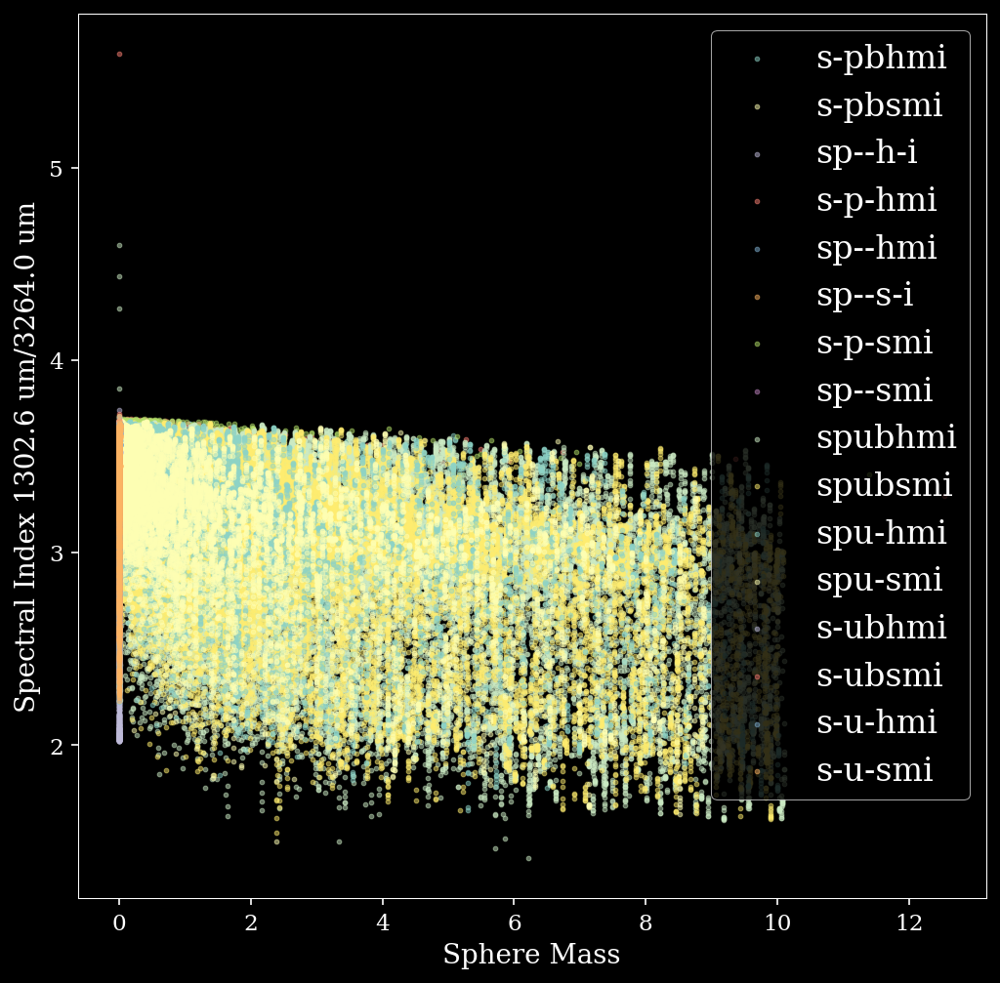

In [48]:
for geometry in geometries:

    print(geometry)
    pars = Table.read(f'/blue/adamginsburg/richardson.t/research/flux/pars/{geometry}_augmented.fits')
    seds = SEDCube.read(f'/blue/adamginsburg/richardson.t/research/flux/robitaille_models-1.2/{geometry}/flux.fits')
    pars['f1mm'] = seds.val[:,3,20].value # 20, 4 = 1300 micron, 700 AU
    pars['f3mm'] = seds.val[:,3,6].value # 6, 4 = 3300 micron, 700 AU
    alpha_1mm3mm = np.log(pars['f1mm']/pars['f3mm']) / np.log(seds.wav[6]/seds.wav[20])
    
    pl.scatter(pars['Sphere Masses'][:,3], alpha_1mm3mm, s=5, alpha=0.5, label=geometry)

pl.legend(loc='best')
pl.xlabel("Sphere Mass");
pl.ylabel(f"Spectral Index {seds.wav[20]:0.1f}/{seds.wav[6]:0.1f}");

s-pbhmi
s-pbsmi
sp--h-i
s-p-hmi
sp--hmi
sp--s-i
s-p-smi
sp--smi
spubhmi
spubsmi
spu-hmi
spu-smi
s-ubhmi
s-ubsmi
s-u-hmi
s-u-smi


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


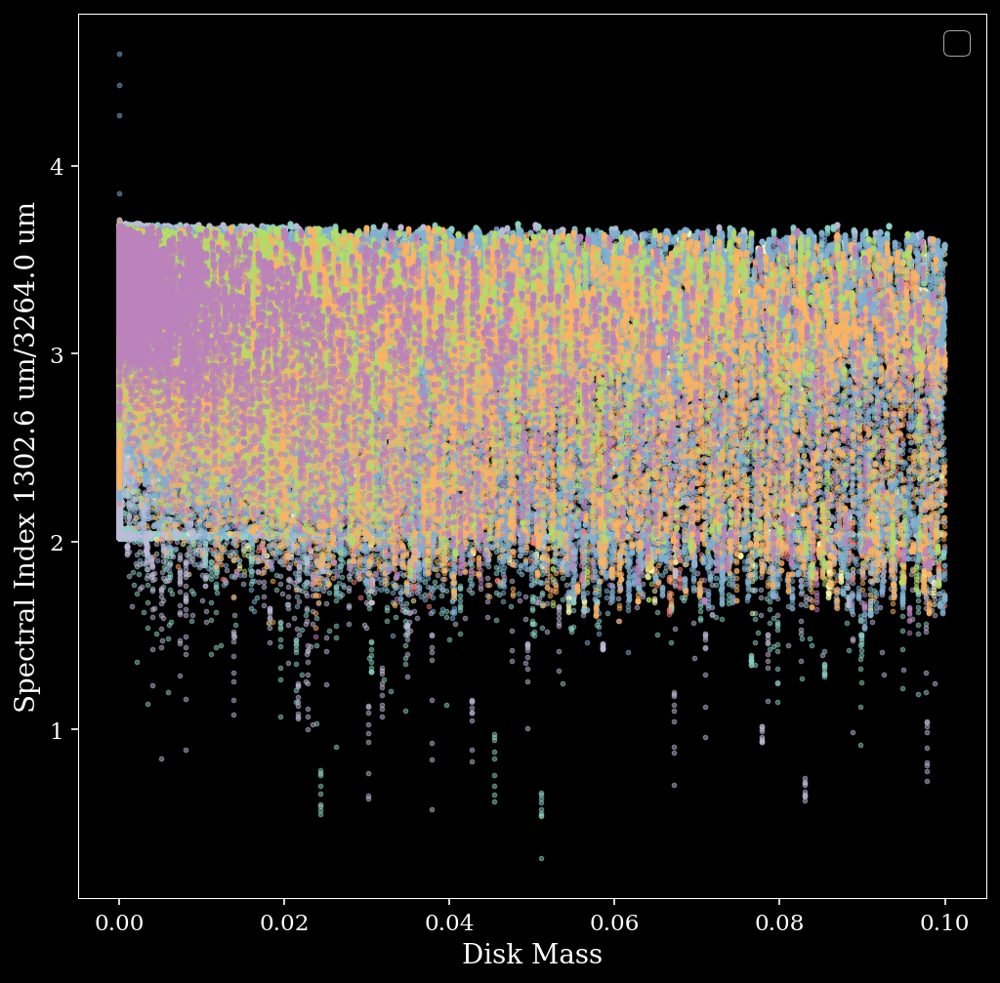

In [51]:
for geometry in geometries:

    print(geometry)
    pars = Table.read(f'/blue/adamginsburg/richardson.t/research/flux/pars/{geometry}_augmented.fits')
    if 'disk.mass' in pars.colnames:
        seds = SEDCube.read(f'/blue/adamginsburg/richardson.t/research/flux/robitaille_models-1.2/{geometry}/flux.fits')
        pars['f1mm'] = seds.val[:,3,20].value # 20, 4 = 1300 micron, 700 AU
        pars['f3mm'] = seds.val[:,3,6].value # 6, 4 = 3300 micron, 700 AU
        alpha_1mm3mm = np.log(pars['f1mm']/pars['f3mm']) / np.log(seds.wav[6]/seds.wav[20])

        pl.scatter(pars['disk.mass'], alpha_1mm3mm, s=5, alpha=0.5)
    
pl.legend(loc='best')
pl.xlabel("Disk Mass");
pl.ylabel(f"Spectral Index {seds.wav[20]:0.1f}/{seds.wav[6]:0.1f}");

s-pbhmi
s-pbsmi
sp--h-i
s-p-hmi
sp--hmi
sp--s-i
s-p-smi
sp--smi
spubhmi
spubsmi
spu-hmi
spu-smi
s-ubhmi
s-ubsmi
s-u-hmi
s-u-smi


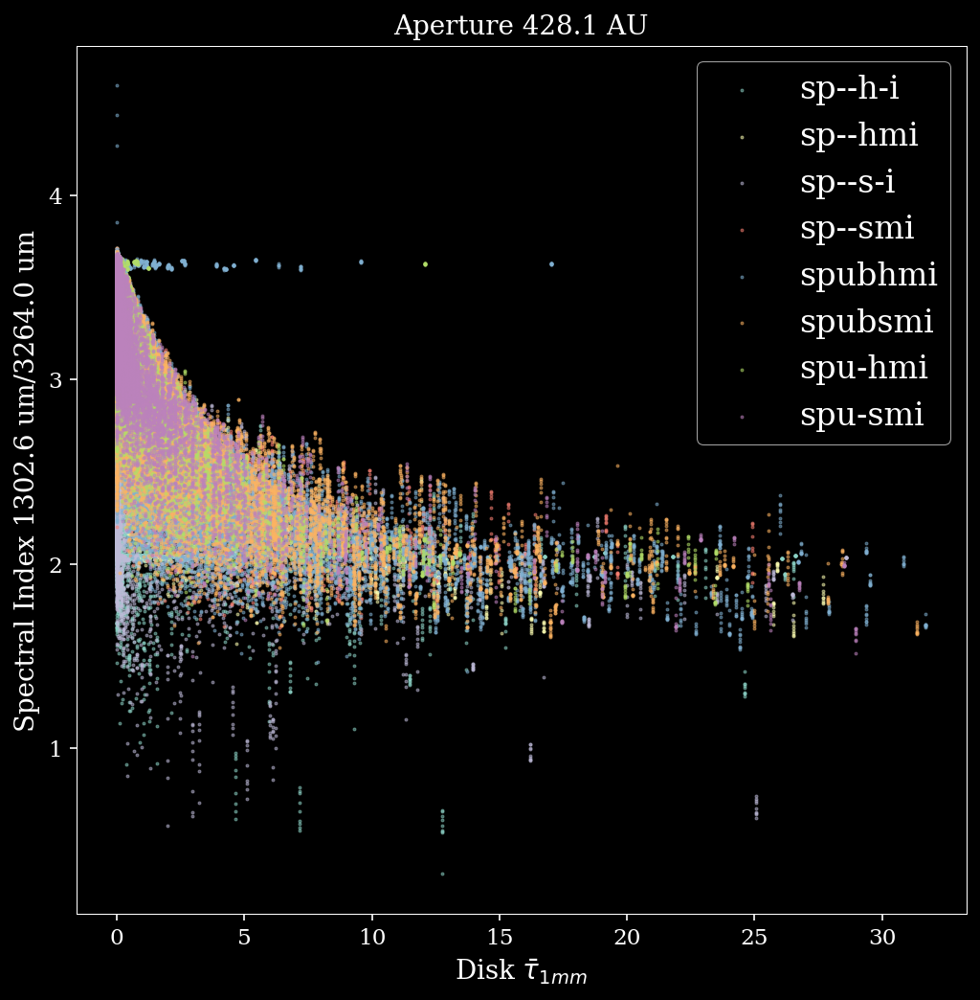

In [108]:
for geometry in geometries:

    print(geometry)
    pars = Table.read(f'/blue/adamginsburg/richardson.t/research/flux/pars/{geometry}_augmented.fits')
    if 'disk.mass' in pars.colnames:
        seds = SEDCube.read(f'/blue/adamginsburg/richardson.t/research/flux/robitaille_models-1.2/{geometry}/flux.fits')
        pars['f1mm'] = seds.val[:,3,20].value # 20, 4 = 1300 micron, 700 AU
        pars['f3mm'] = seds.val[:,3,6].value # 6, 4 = 3300 micron, 700 AU
        alpha_1mm3mm = np.log(pars['f1mm']/pars['f3mm']) / np.log(seds.wav[6]/seds.wav[20])

        pl.scatter(0.283*pars['disk.mass']*2e33/(np.pi*1.5e13**2*pars['disk.rmax']**2), alpha_1mm3mm, s=2, alpha=0.5, label=geometry)
    
pl.legend(loc='best')
pl.title(f'Aperture {seds.apertures[3]:0.1f}')
pl.xlabel(r"Disk $\bar{\tau}_{1mm}$");
pl.ylabel(f"Spectral Index {seds.wav[20]:0.1f}/{seds.wav[6]:0.1f}");

In [112]:
Table.read(f'/blue/adamginsburg/richardson.t/research/flux/pars/sp--h-i_augmented.fits')

MODEL_NAME,star.radius,star.temperature,disk.mass,disk.rmax,disk.beta,disk.p,disk.h100,disk.rmin,scattering,inclination,Model Luminosity,Sphere Masses,Outer Radius,Disk Minimum Q
,,,,,,,,,,,solLum,,,
bytes20,float64,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64,float64[20],float64,float64
016nTMSL_01,7.735,2504.0,1.82e-08,176.8,1.243,-1.496,14.66,142.6,1,9.508448986680277,2.1191007856424178,-- .. --,7.3032363106031015,39289.27689570235
016nTMSL_02,7.735,2504.0,1.82e-08,176.8,1.243,-1.496,14.66,142.6,1,12.614336634150177,2.1191007856424178,-- .. --,7.3032363106031015,39289.27689570235
016nTMSL_03,7.735,2504.0,1.82e-08,176.8,1.243,-1.496,14.66,142.6,1,20.191599358050162,2.1191007856424178,-- .. --,7.3032363106031015,39289.27689570235
016nTMSL_04,7.735,2504.0,1.82e-08,176.8,1.243,-1.496,14.66,142.6,1,35.691015081233466,2.1191007856424178,-- .. --,7.3032363106031015,39289.27689570235
016nTMSL_05,7.735,2504.0,1.82e-08,176.8,1.243,-1.496,14.66,142.6,1,47.04057079467769,2.1191007856424178,-- .. --,7.3032363106031015,39289.27689570235
016nTMSL_06,7.735,2504.0,1.82e-08,176.8,1.243,-1.496,14.66,142.6,1,51.733360414270194,2.1191007856424178,-- .. --,7.3032363106031015,39289.27689570235
016nTMSL_07,7.735,2504.0,1.82e-08,176.8,1.243,-1.496,14.66,142.6,1,68.94088554235539,2.1191007856424178,-- .. --,7.3032363106031015,39289.27689570235
016nTMSL_08,7.735,2504.0,1.82e-08,176.8,1.243,-1.496,14.66,142.6,1,70.32723617578539,2.1191007856424178,-- .. --,7.3032363106031015,39289.27689570235


s-pbhmi
s-pbsmi
sp--h-i
s-p-hmi
sp--hmi
sp--s-i
s-p-smi
sp--smi
spubhmi
spubsmi
spu-hmi
spu-smi
s-ubhmi
s-ubsmi
s-u-hmi
s-u-smi


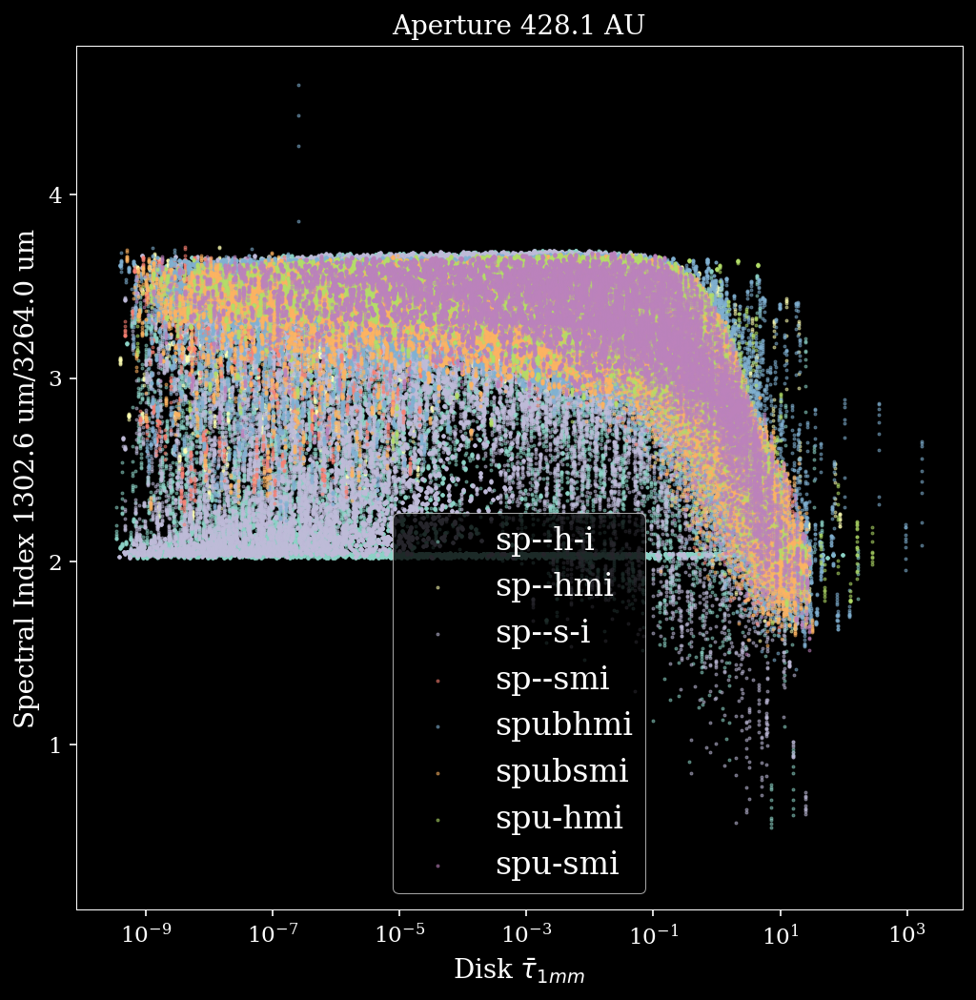

In [113]:
for geometry in geometries:

    print(geometry)
    pars = Table.read(f'/blue/adamginsburg/richardson.t/research/flux/pars/{geometry}_augmented.fits')
    if 'disk.mass' in pars.colnames:
        seds = SEDCube.read(f'/blue/adamginsburg/richardson.t/research/flux/robitaille_models-1.2/{geometry}/flux.fits')
        pars['f1mm'] = seds.val[:,3,20].value # 20, 4 = 1300 micron, 700 AU
        pars['f3mm'] = seds.val[:,3,6].value # 6, 4 = 3300 micron, 700 AU
        alpha_1mm3mm = np.log(pars['f1mm']/pars['f3mm']) / np.log(seds.wav[6]/seds.wav[20])

        if 'disk.rmin' in pars.colnames:
            pl.scatter(0.283*pars['disk.mass']*2e33/(np.pi*1.5e13**2*(pars['disk.rmax']**2 - pars['disk.rmin']**2)), alpha_1mm3mm, s=2, alpha=0.5, label=geometry)
        else:
            pl.scatter(0.283*pars['disk.mass']*2e33/(np.pi*1.5e13**2*pars['disk.rmax']**2), alpha_1mm3mm, s=2, alpha=0.5, label=geometry)
    
pl.semilogx()
pl.legend(loc='best')
pl.title(f'Aperture {seds.apertures[3]:0.1f}')
pl.xlabel(r"Disk $\bar{\tau}_{1mm}$");
pl.ylabel(f"Spectral Index {seds.wav[20]:0.1f}/{seds.wav[6]:0.1f}");

s-pbhmi
s-pbsmi
sp--h-i
s-p-hmi
sp--hmi
sp--s-i
s-p-smi
sp--smi
spubhmi
spubsmi
spu-hmi
spu-smi
s-ubhmi
s-ubsmi
s-u-hmi
s-u-smi


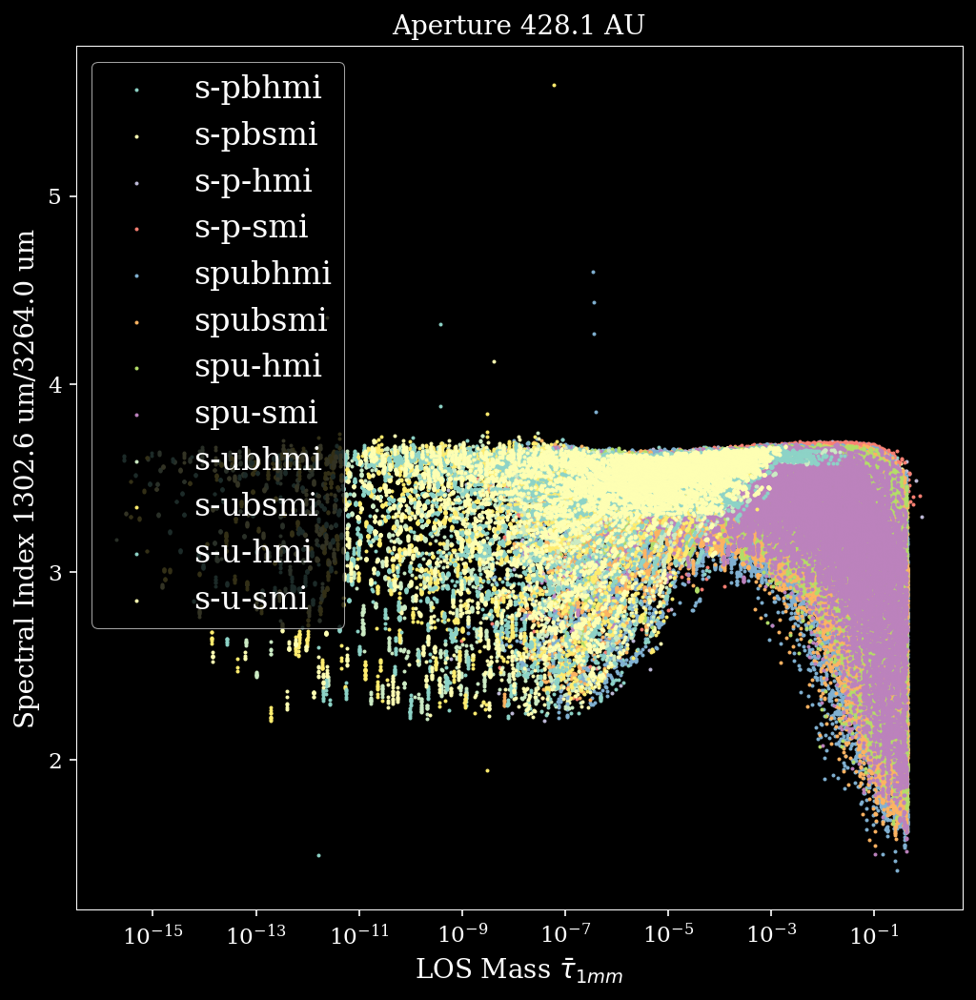

In [117]:
for geometry in geometries:

    print(geometry)
    pars = Table.read(f'/blue/adamginsburg/richardson.t/research/flux/pars/{geometry}_augmented.fits')
    if 'Line-of-Sight Masses' in pars.colnames:
        seds = SEDCube.read(f'/blue/adamginsburg/richardson.t/research/flux/robitaille_models-1.2/{geometry}/flux.fits')
        pars['f1mm'] = seds.val[:,3,20].value # 20, 4 = 1300 micron, 700 AU
        pars['f3mm'] = seds.val[:,3,6].value # 6, 4 = 3300 micron, 700 AU
        alpha_1mm3mm = np.log(pars['f1mm']/pars['f3mm']) / np.log(seds.wav[6]/seds.wav[20])

        pl.scatter(0.00283*pars['Line-of-Sight Masses'][:,3]*2e33/(np.pi*seds.apertures[3]**2*1.5e13**2), alpha_1mm3mm, s=2, alpha=1, label=geometry)
    
pl.semilogx()
pl.legend(loc='best')
pl.title(f'Aperture {seds.apertures[3]:0.1f}')
pl.xlabel(r"LOS Mass $\bar{\tau}_{1mm}$");
pl.ylabel(f"Spectral Index {seds.wav[20]:0.1f}/{seds.wav[6]:0.1f}");

s-pbhmi
s-pbsmi
sp--h-i
s-p-hmi
sp--hmi
sp--s-i
s-p-smi
sp--smi
spubhmi
spubsmi
spu-hmi
spu-smi
s-ubhmi
s-ubsmi
s-u-hmi
s-u-smi


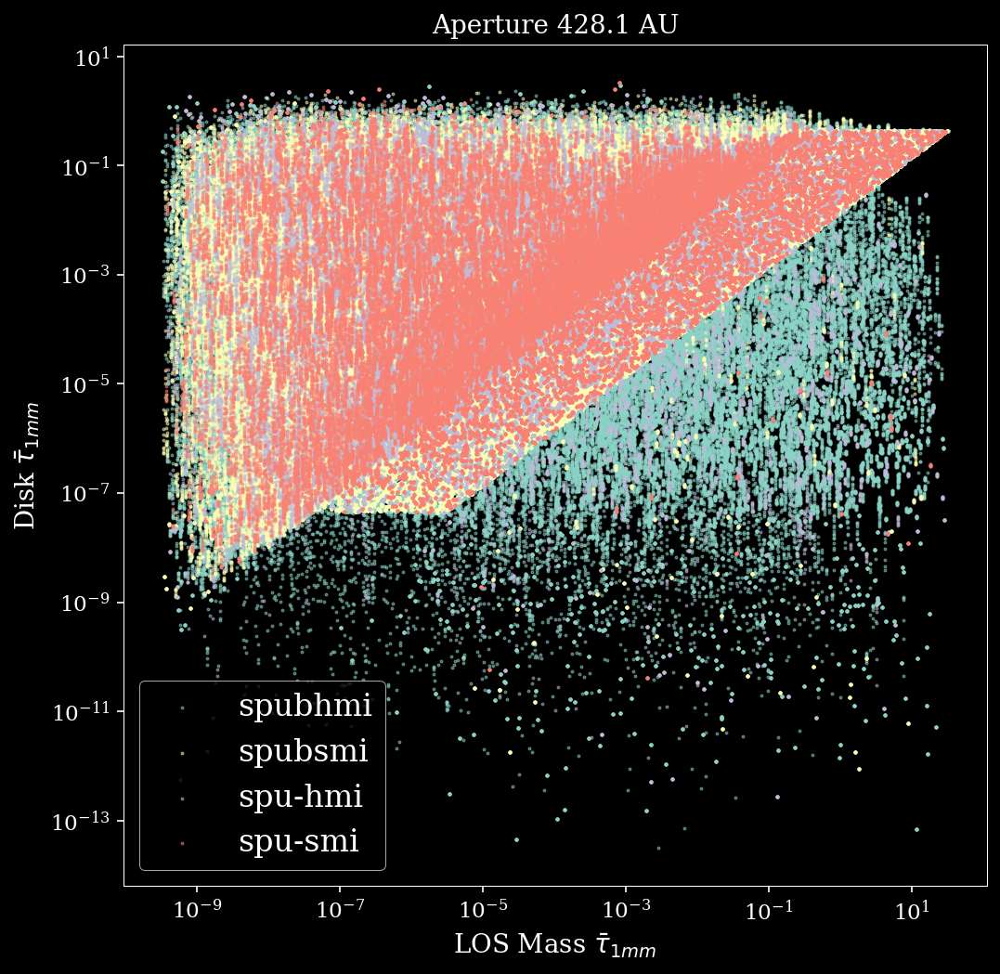

In [123]:
apnum=3
for geometry in geometries:

    print(geometry)
    pars = Table.read(f'/blue/adamginsburg/richardson.t/research/flux/pars/{geometry}_augmented.fits')
    if 'Line-of-Sight Masses' in pars.colnames and 'disk.mass' in pars.colnames:
        seds = SEDCube.read(f'/blue/adamginsburg/richardson.t/research/flux/robitaille_models-1.2/{geometry}/flux.fits')
        pars['f1mm'] = seds.val[:,apnum,20].value # 20, 4 = 1300 micron, 700 AU
        pars['f3mm'] = seds.val[:,apnum,6].value # 6, 4 = 3300 micron, 700 AU
        alpha_1mm3mm = np.log(pars['f1mm']/pars['f3mm']) / np.log(seds.wav[6]/seds.wav[20])
        bad3mm = np.isnan(pars['f3mm'])
        bad1mm = np.isnan(pars['f1mm'])

        pl.scatter(0.283*pars['disk.mass']*2e33/(np.pi*1.5e13**2*pars['disk.rmax']**2),
                   0.00283*pars['Line-of-Sight Masses'][:,apnum]*2e33/(np.pi*seds.apertures[apnum]**2*1.5e13**2), s=2, alpha=0.5, label=geometry)
        #pl.scatter((0.283*pars['disk.mass']*2e33/(np.pi*1.5e13**2*pars['disk.rmax']**2))[bad3mm],
        #           (0.00283*pars['Line-of-Sight Masses'][:,apnum]*2e33/(np.pi*seds.apertures[apnum]**2*1.5e13**2))[bad3mm], s=1, alpha=0.5,  marker='x', color='r')
        #pl.scatter((0.283*pars['disk.mass']*2e33/(np.pi*1.5e13**2*pars['disk.rmax']**2))[bad1mm],
        #           (0.00283*pars['Line-of-Sight Masses'][:,apnum]*2e33/(np.pi*seds.apertures[apnum]**2*1.5e13**2))[bad1mm], s=1, alpha=1,  marker='+', color='y')
    
pl.loglog()
pl.legend(loc='best')
pl.title(f'Aperture {seds.apertures[apnum]:0.1f}')
pl.xlabel(r"LOS Mass $\bar{\tau}_{1mm}$");
pl.ylabel(r"Disk $\bar{\tau}_{1mm}$");

s-pbhmi
s-pbsmi
sp--h-i
s-p-hmi
sp--hmi
sp--s-i
s-p-smi
sp--smi
spubhmi
spubsmi
spu-hmi
spu-smi
s-ubhmi
s-ubsmi
s-u-hmi
s-u-smi


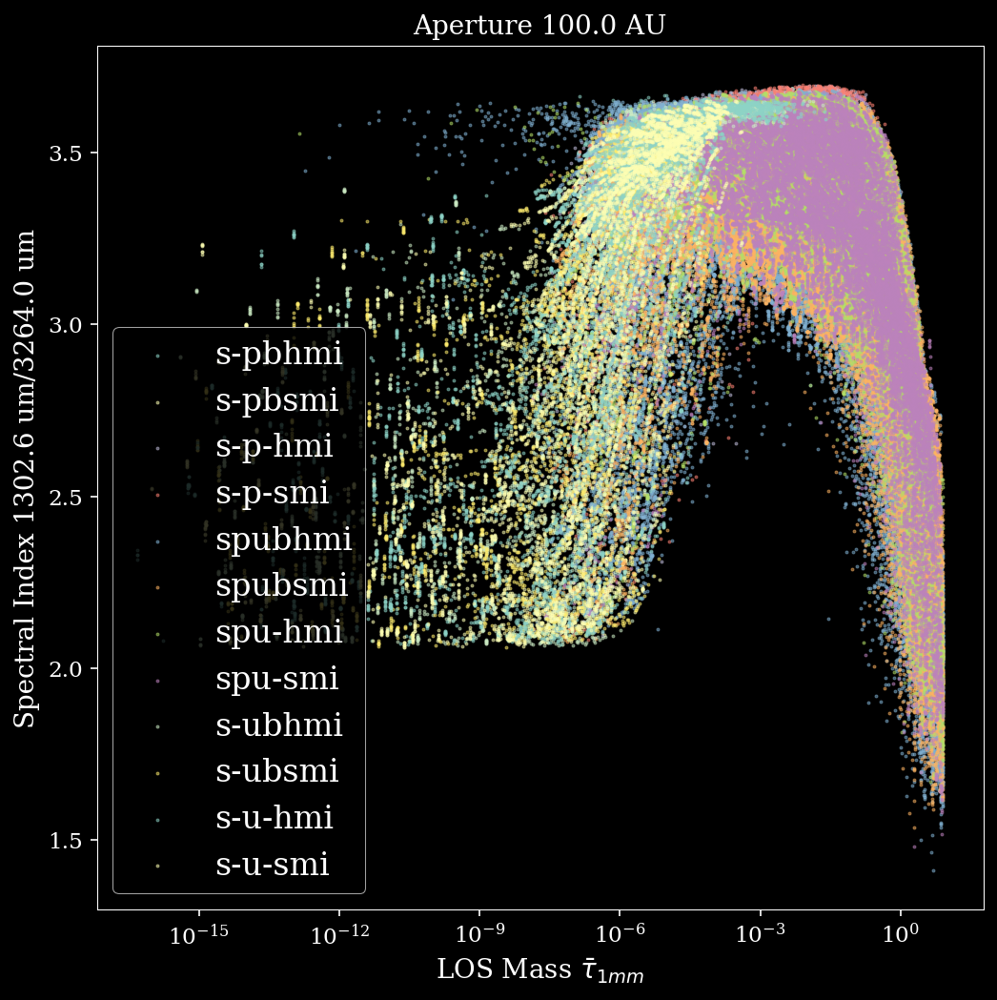

In [116]:
apnum=0
for geometry in geometries:

    print(geometry)
    pars = Table.read(f'/blue/adamginsburg/richardson.t/research/flux/pars/{geometry}_augmented.fits')
    if 'Line-of-Sight Masses' in pars.colnames:
        seds = SEDCube.read(f'/blue/adamginsburg/richardson.t/research/flux/robitaille_models-1.2/{geometry}/flux.fits')
        pars['f1mm'] = seds.val[:,apnum,20].value # 20, 4 = 1300 micron, 700 AU
        pars['f3mm'] = seds.val[:,apnum,6].value # 6, 4 = 3300 micron, 700 AU
        alpha_1mm3mm = np.log(pars['f1mm']/pars['f3mm']) / np.log(seds.wav[6]/seds.wav[20])

        pl.scatter(0.00283*pars['Line-of-Sight Masses'][:,apnum]*2e33/(np.pi*seds.apertures[apnum]**2*1.5e13**2), alpha_1mm3mm, s=2, alpha=0.5, label=geometry)
    
pl.semilogx()
pl.legend(loc='best')
pl.title(f'Aperture {seds.apertures[apnum]:0.1f}')
pl.xlabel(r"LOS Mass $\bar{\tau}_{1mm}$");
pl.ylabel(f"Spectral Index {seds.wav[20]:0.1f}/{seds.wav[6]:0.1f}");

In [53]:
seds.val[:,3,20]

<Quantity [0.047506  , 0.04750202, 0.0475028 , ...,        nan,        nan,
                  nan] mJy>

In [52]:
pars.colnames

['MODEL_NAME',
 'star.radius',
 'star.temperature',
 'envelope.rho_0',
 'envelope.rc',
 'ambient.density',
 'ambient.temperature',
 'scattering',
 'inclination',
 'Model Luminosity',
 'Line-of-Sight Masses',
 'Sphere Masses',
 'Outer Radius',
 'Line-of-Sight Weighted Temperatures',
 'Sphere Weighted Temperatures']

s-pbhmi
s-pbsmi
sp--h-i
sp--h-i 20284
s-p-hmi
sp--hmi
sp--hmi 509
sp--s-i
sp--s-i 9583
s-p-smi
sp--smi
sp--smi 525
spubhmi
spubhmi 3456
spubsmi
spubsmi 2035
spu-hmi
spu-hmi 495
spu-smi
spu-smi 546
s-ubhmi
s-ubsmi
s-u-hmi
s-u-smi


Text(0, 0.5, 'Model Luminosity')

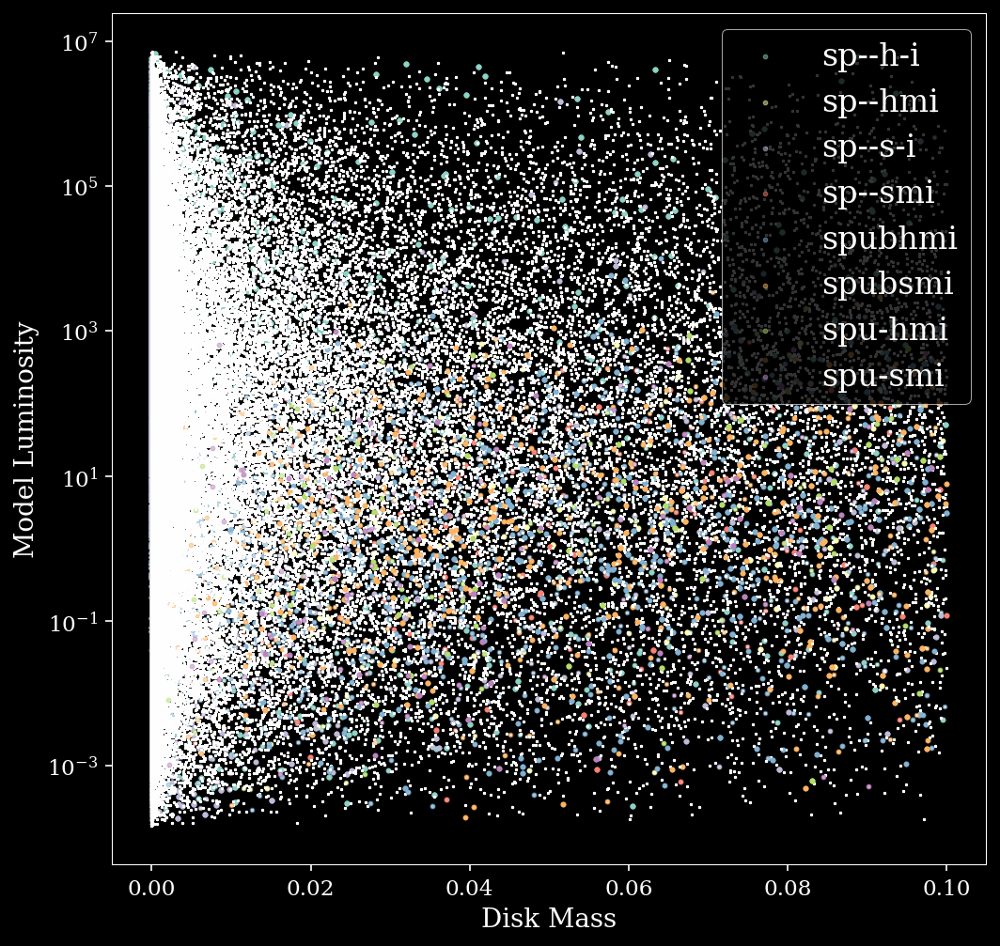

In [57]:
for geometry in geometries:

    print(geometry)
    pars = Table.read(f'/blue/adamginsburg/richardson.t/research/flux/pars/{geometry}_augmented.fits')
    if 'disk.mass' in pars.colnames:
        seds = SEDCube.read(f'/blue/adamginsburg/richardson.t/research/flux/robitaille_models-1.2/{geometry}/flux.fits')
        pars['f1mm'] = seds.val[:,3,20].value # 20, 4 = 1300 micron, 700 AU
        pars['f3mm'] = seds.val[:,3,6].value # 6, 4 = 3300 micron, 700 AU
        alpha_1mm3mm = np.log(pars['f1mm']/pars['f3mm']) / np.log(seds.wav[6]/seds.wav[20])

        sel = (alpha_1mm3mm > 1.8) & (alpha_1mm3mm < 2.2)
        #sel &= seds.val[:,3,20] > 2.5*u.mJy * (8/1)**2
        print(geometry, sel.sum())
        pl.scatter(pars['disk.mass'], pars['Model Luminosity'], s=1, alpha=0.5, color='w')
        pl.scatter(pars['disk.mass'][sel], pars['Model Luminosity'][sel], s=5, alpha=0.5, label=geometry)
    
pl.semilogy()
pl.legend(loc='best')
pl.xlabel("Disk Mass");
pl.ylabel("Model Luminosity")

In [60]:
pars.colnames

['MODEL_NAME',
 'star.radius',
 'star.temperature',
 'envelope.rho_0',
 'envelope.rc',
 'ambient.density',
 'ambient.temperature',
 'scattering',
 'inclination',
 'Model Luminosity',
 'Line-of-Sight Masses',
 'Sphere Masses',
 'Outer Radius',
 'Line-of-Sight Weighted Temperatures',
 'Sphere Weighted Temperatures']

s-pbhmi
s-pbsmi
sp--h-i
sp--h-i 20284
s-p-hmi
sp--hmi
sp--hmi 509
sp--s-i
sp--s-i 9583
s-p-smi
sp--smi
sp--smi 525
spubhmi
spubhmi 3456
spubsmi
spubsmi 2035
spu-hmi
spu-hmi 495
spu-smi
spu-smi 546
s-ubhmi
s-ubsmi
s-u-hmi
s-u-smi


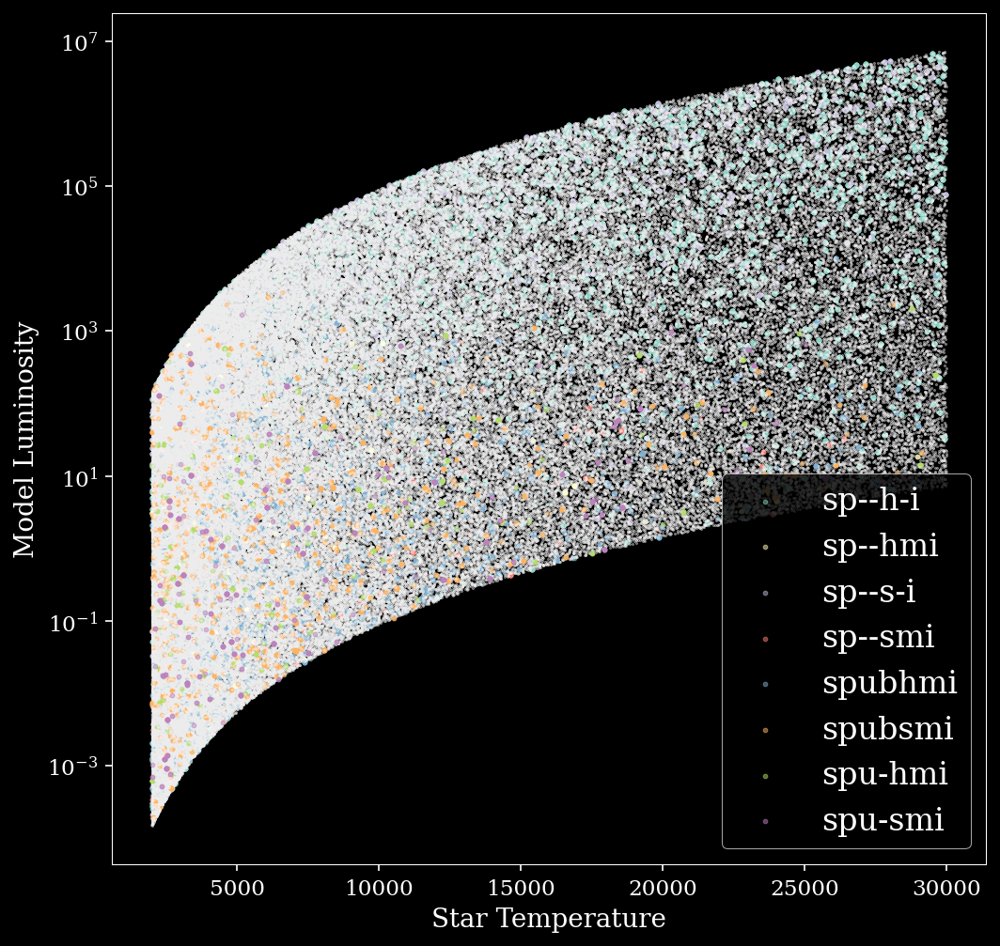

In [63]:
for geometry in geometries:

    print(geometry)
    pars = Table.read(f'/blue/adamginsburg/richardson.t/research/flux/pars/{geometry}_augmented.fits')
    seds = SEDCube.read(f'/blue/adamginsburg/richardson.t/research/flux/robitaille_models-1.2/{geometry}/flux.fits')
    pars['f1mm'] = seds.val[:,3,20].value # 20, 4 = 1300 micron, 700 AU
    pars['f3mm'] = seds.val[:,3,6].value # 6, 4 = 3300 micron, 700 AU
    alpha_1mm3mm = np.log(pars['f1mm']/pars['f3mm']) / np.log(seds.wav[6]/seds.wav[20])

    sel = (alpha_1mm3mm > 1.8) & (alpha_1mm3mm < 2.2)
    #sel &= seds.val[:,3,20] > 2.5*u.mJy * (8/1)**2
    print(geometry, sel.sum())
    pl.scatter(pars['star.temperature'], pars['Model Luminosity'], s=1, alpha=0.05, color='w')
    pl.scatter(pars['star.temperature'][sel], pars['Model Luminosity'][sel], s=5, alpha=0.5, label=geometry)
    
pl.semilogy()
pl.legend(loc='best')
pl.xlabel("Star Temperature");
pl.ylabel("Model Luminosity");

s-pbhmi
s-pbsmi
sp--h-i
sp--h-i 20284
s-p-hmi
sp--hmi
sp--hmi 509
sp--s-i
sp--s-i 9583
s-p-smi
sp--smi
sp--smi 525
spubhmi
spubhmi 3456
spubsmi
spubsmi 2035
spu-hmi
spu-hmi 495
spu-smi
spu-smi 546
s-ubhmi
s-ubsmi
s-u-hmi
s-u-smi


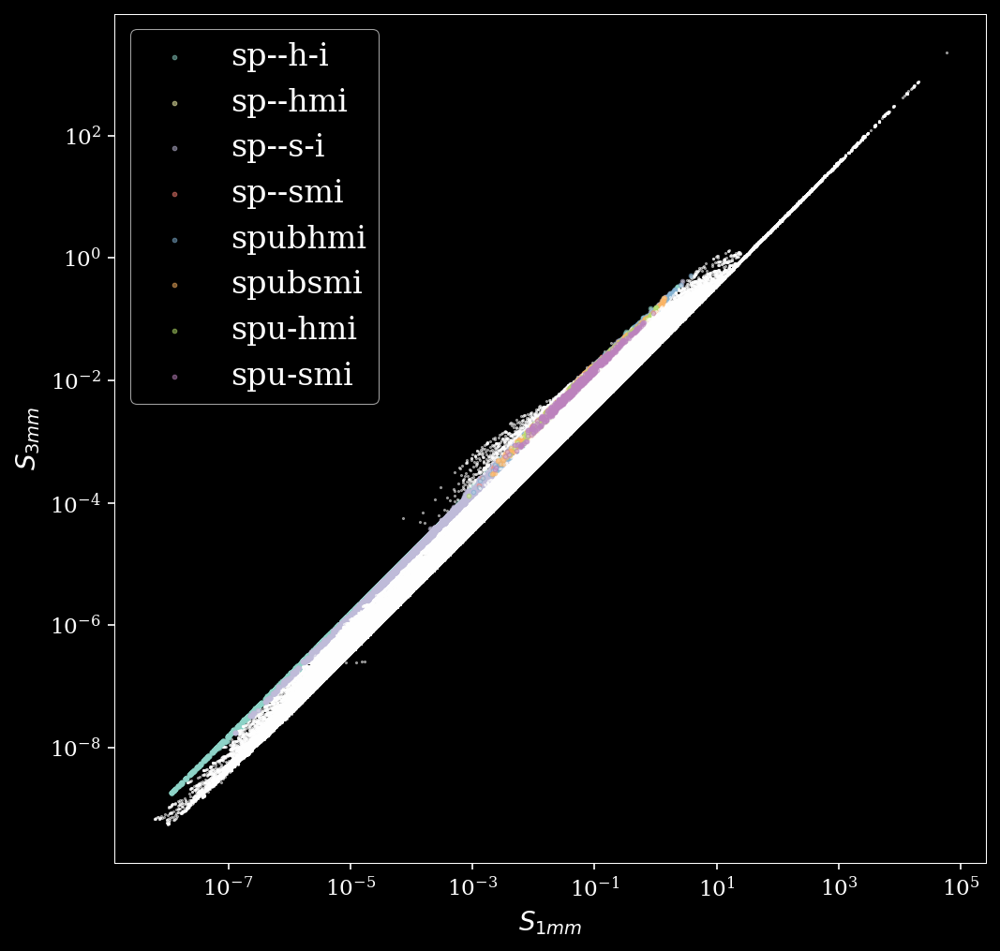

In [59]:
for geometry in geometries:

    print(geometry)
    pars = Table.read(f'/blue/adamginsburg/richardson.t/research/flux/pars/{geometry}_augmented.fits')
    if 'disk.mass' in pars.colnames:
        seds = SEDCube.read(f'/blue/adamginsburg/richardson.t/research/flux/robitaille_models-1.2/{geometry}/flux.fits')
        pars['f1mm'] = seds.val[:,3,20].value # 20, 4 = 1300 micron, 700 AU
        pars['f3mm'] = seds.val[:,3,6].value # 6, 4 = 3300 micron, 700 AU
        alpha_1mm3mm = np.log(pars['f1mm']/pars['f3mm']) / np.log(seds.wav[6]/seds.wav[20])

        sel = (alpha_1mm3mm > 1.8) & (alpha_1mm3mm < 2.2)
        #sel &= seds.val[:,3,20] > 2.5*u.mJy * (8/1)**2
        print(geometry, sel.sum())
        scale = 1/8**2
        pl.scatter(scale*pars['f1mm'], scale*pars['f3mm'], s=1, alpha=0.5, color='w')
        pl.scatter(scale*pars['f1mm'][sel], scale*pars['f3mm'][sel], s=5, alpha=0.5, label=geometry)
    
pl.loglog()
pl.legend(loc='best')
pl.xlabel("$S_{1mm}$");
pl.ylabel("$S_{3mm}$");

In [71]:
from astropy.modeling.models import BlackBody

s-pbhmi
s-pbhmi 0
s-pbsmi
s-pbsmi 0
sp--h-i
s-p-hmi
s-p-hmi 0
sp--hmi
sp--s-i
s-p-smi
s-p-smi 0
sp--smi
spubhmi
spubhmi 2
spubsmi
spubsmi 0
spu-hmi
spu-hmi 0
spu-smi
spu-smi 0
s-ubhmi
s-ubhmi 0
s-ubsmi
s-ubsmi 0
s-u-hmi
s-u-hmi 0
s-u-smi
s-u-smi 0


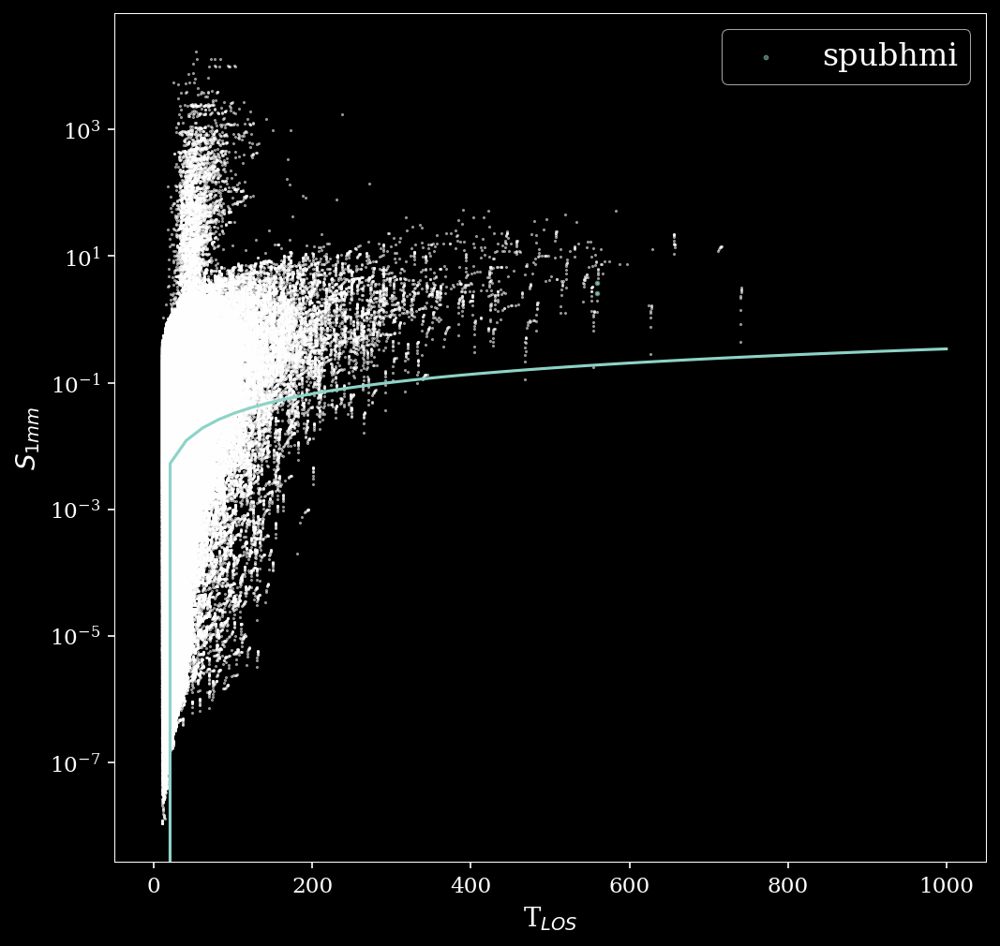

In [118]:
distance = 8*u.kpc
for geometry in geometries:

    print(geometry)
    pars = Table.read(f'/blue/adamginsburg/richardson.t/research/flux/pars/{geometry}_augmented.fits')
    if 'Line-of-Sight Weighted Temperatures' in pars.colnames:
        seds = SEDCube.read(f'/blue/adamginsburg/richardson.t/research/flux/robitaille_models-1.2/{geometry}/flux.fits')
        pars['f1mm'] = seds.val[:,3,20].value # 20, 4 = 1300 micron, 700 AU  3=438 au
        pars['f3mm'] = seds.val[:,3,6].value # 6, 4 = 3300 micron, 700 AU  3=438 au
        alpha_1mm3mm = np.log(pars['f1mm']/pars['f3mm']) / np.log(seds.wav[6]/seds.wav[20])

        sel = (alpha_1mm3mm > 1.8) & (alpha_1mm3mm < 2.2)
        sel &= seds.val[:,3,20] > 2.5*u.mJy * (distance/(1*u.kpc))**2
        print(geometry, sel.sum())
        scale = 1/distance.to(u.kpc).value**2
        pl.scatter( pars['Line-of-Sight Weighted Temperatures'][:,3],scale*pars['f1mm'], s=1, alpha=0.5, color='w')
        if any(sel):
            pl.scatter(pars['Line-of-Sight Weighted Temperatures'][:,3][sel], scale*pars['f1mm'][sel],  s=5, alpha=0.5, label=geometry)
# maximum intensity possible:
tems = np.linspace(0,1000)*u.K
pl.plot(tems, (BlackBody(tems)(seds.wav[20]) * (np.pi*seds.apertures[3]**2 / distance**2).to(u.sr, u.dimensionless_angles())).to(u.Jy))
pl.semilogy()
pl.legend(loc='best')
pl.ylabel("$S_{1mm}$");
pl.xlabel("T$_{LOS}$");

s-pbhmi
s-pbhmi 125
s-pbsmi
s-pbsmi 129
sp--h-i
s-p-hmi
s-p-hmi 8
sp--hmi
sp--s-i
s-p-smi
s-p-smi 15
sp--smi
spubhmi
spubhmi 3746
spubsmi
spubsmi 2177
spu-hmi
spu-hmi 514
spu-smi
spu-smi 589
s-ubhmi
s-ubhmi 363
s-ubsmi
s-ubsmi 387
s-u-hmi
s-u-hmi 402
s-u-smi
s-u-smi 421


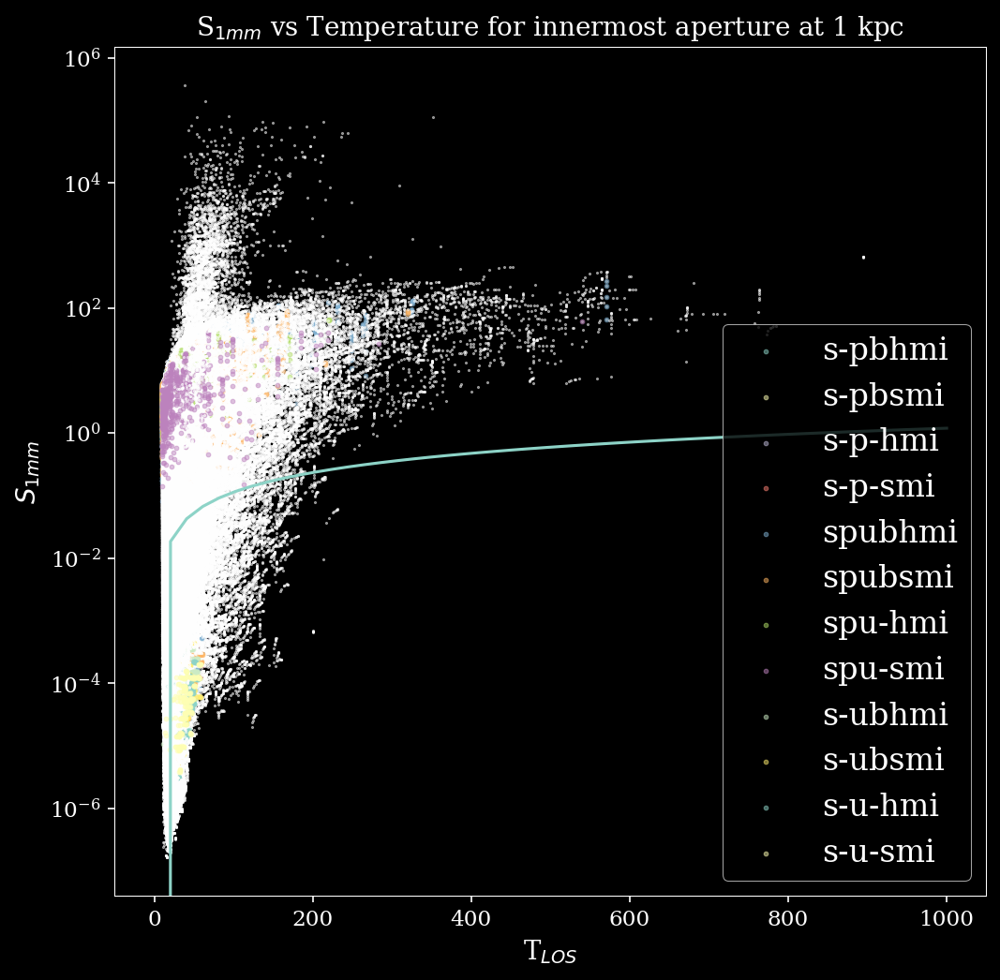

In [103]:
distance = 1*u.kpc
for geometry in geometries:

    print(geometry)
    pars = Table.read(f'/blue/adamginsburg/richardson.t/research/flux/pars/{geometry}_augmented.fits')
    if 'Line-of-Sight Weighted Temperatures' in pars.colnames:
        seds = SEDCube.read(f'/blue/adamginsburg/richardson.t/research/flux/robitaille_models-1.2/{geometry}/flux.fits')
        pars['f1mm'] = seds.val[:,0,20].value # 20, 4 = 1300 micron, 700 AU  3=438 au
        pars['f3mm'] = seds.val[:,0,6].value # 6, 4 = 3300 micron, 700 AU  3=438 au
        alpha_1mm3mm = np.log(pars['f1mm']/pars['f3mm']) / np.log(seds.wav[6]/seds.wav[20])

        sel = (alpha_1mm3mm > 1.8) & (alpha_1mm3mm < 2.2)
        #sel &= seds.val[:,3,20] > 2.5*u.mJy * (8/1)**2
        print(geometry, sel.sum())
        scale = 1/distance.to(u.kpc).value**2
        pl.scatter( pars['Line-of-Sight Weighted Temperatures'][:,0],scale*pars['f1mm'], s=1, alpha=0.5, color='w')
        if any(sel):
            pl.scatter(pars['Line-of-Sight Weighted Temperatures'][:,0][sel], scale*pars['f1mm'][sel],  s=5, alpha=0.5, label=geometry)
# maximum intensity possible:
tems = np.linspace(0,1000)*u.K
pl.plot(tems, (BlackBody(tems)(seds.wav[20]) * (np.pi*seds.apertures[0]**2 / distance**2).to(u.sr, u.dimensionless_angles())).to(u.Jy))
pl.semilogy()
pl.legend(loc='best')
pl.title("S$_{1mm}$ vs Temperature for innermost aperture at 1 kpc")
pl.ylabel("$S_{1mm}$");
pl.xlabel("T$_{LOS}$");

s-pbhmi
s-pbhmi 0
s-pbsmi
s-pbsmi 0
sp--h-i
s-p-hmi
s-p-hmi 0
sp--hmi
sp--s-i
s-p-smi
s-p-smi 0
sp--smi
spubhmi
spubhmi 3337
spubsmi
spubsmi 1945
spu-hmi
spu-hmi 480
spu-smi
spu-smi 527
s-ubhmi
s-ubhmi 1
s-ubsmi
s-ubsmi 1
s-u-hmi
s-u-hmi 0
s-u-smi
s-u-smi 0


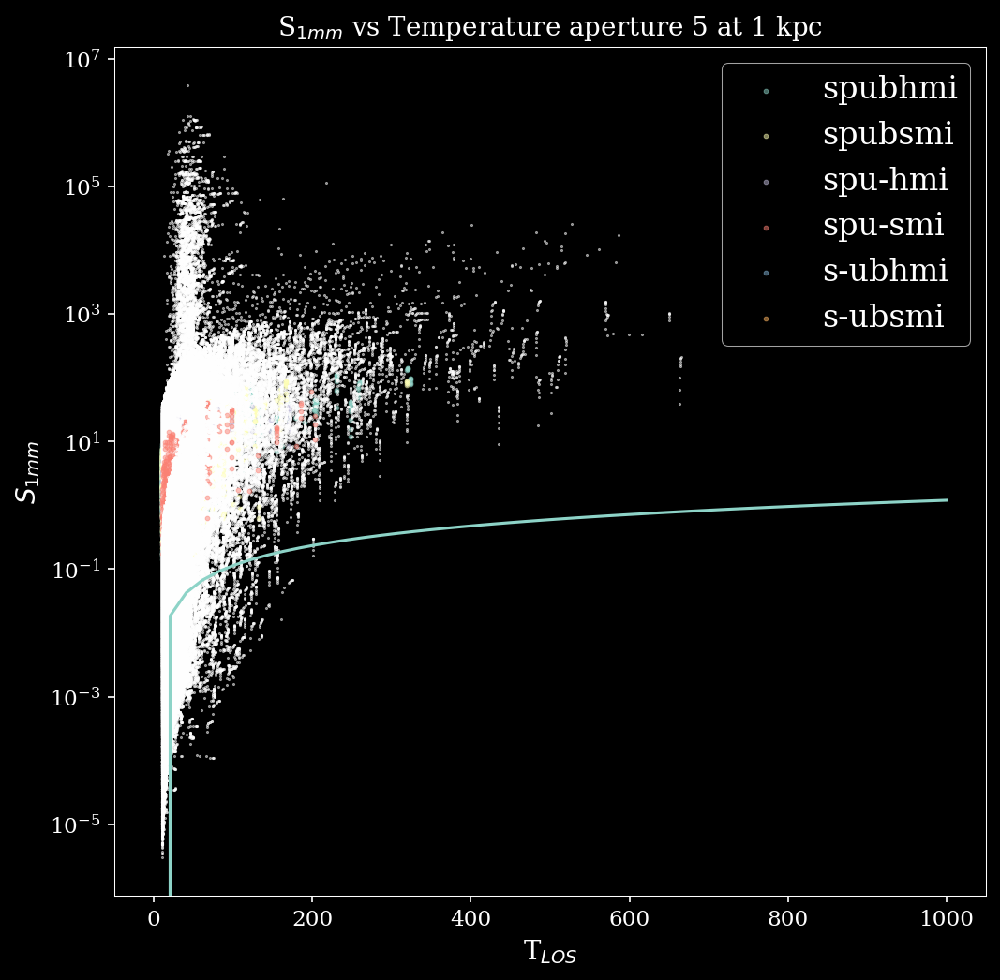

In [102]:
distance = 1*u.kpc
for geometry in geometries:

    print(geometry)
    pars = Table.read(f'/blue/adamginsburg/richardson.t/research/flux/pars/{geometry}_augmented.fits')
    if 'Line-of-Sight Weighted Temperatures' in pars.colnames:
        seds = SEDCube.read(f'/blue/adamginsburg/richardson.t/research/flux/robitaille_models-1.2/{geometry}/flux.fits')
        pars['f1mm'] = seds.val[:,5,20].value # 20, 4 = 1300 micron, 700 AU  3=438 au
        pars['f3mm'] = seds.val[:,5,6].value # 6, 4 = 3300 micron, 700 AU  3=438 au
        alpha_1mm3mm = np.log(pars['f1mm']/pars['f3mm']) / np.log(seds.wav[6]/seds.wav[20])

        sel = (alpha_1mm3mm > 1.8) & (alpha_1mm3mm < 2.2)
        #sel &= seds.val[:,3,20] > 2.5*u.mJy * (8/1)**2
        print(geometry, sel.sum())
        scale = 1/distance.to(u.kpc).value**2
        pl.scatter( pars['Line-of-Sight Weighted Temperatures'][:,5],scale*pars['f1mm'], s=1, alpha=0.5, color='w')
        if any(sel):
            pl.scatter(pars['Line-of-Sight Weighted Temperatures'][:,5][sel], scale*pars['f1mm'][sel],  s=5, alpha=0.5, label=geometry)
# maximum intensity possible:
tems = np.linspace(0,1000)*u.K
pl.plot(tems, (BlackBody(tems)(seds.wav[20]) * (np.pi*seds.apertures[0]**2 / distance**2).to(u.sr, u.dimensionless_angles())).to(u.Jy))
pl.semilogy()
pl.legend(loc='best')
pl.title("S$_{1mm}$ vs Temperature aperture 5 at 1 kpc")
pl.ylabel("$S_{1mm}$");
pl.xlabel("T$_{LOS}$");

s-pbhmi
s-pbhmi 0
s-pbsmi
s-pbsmi 0
sp--h-i
s-p-hmi
s-p-hmi 0
sp--hmi
sp--s-i
s-p-smi
s-p-smi 0
sp--smi
spubhmi
spubhmi 3456
spubsmi
spubsmi 2035
spu-hmi
spu-hmi 495
spu-smi
spu-smi 546
s-ubhmi
s-ubhmi 0
s-ubsmi
s-ubsmi 1
s-u-hmi
s-u-hmi 0
s-u-smi
s-u-smi 0


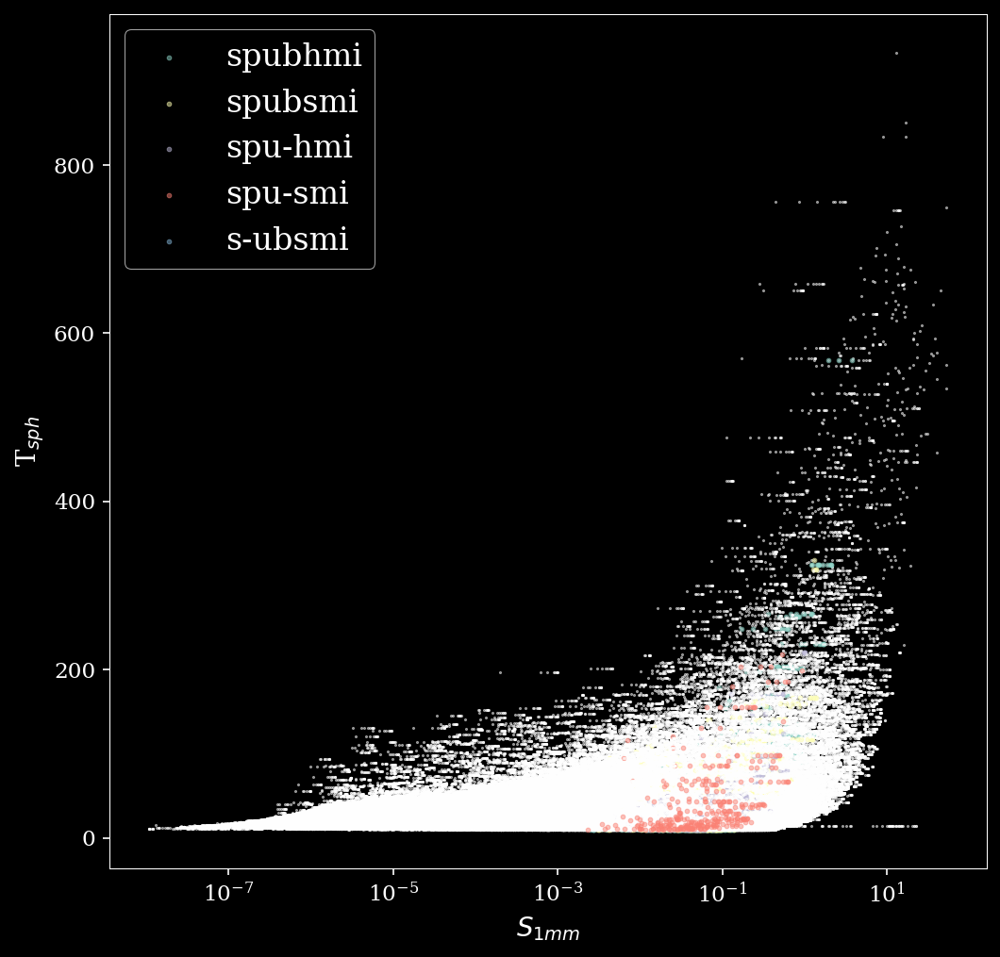

In [70]:
for geometry in geometries:

    print(geometry)
    pars = Table.read(f'/blue/adamginsburg/richardson.t/research/flux/pars/{geometry}_augmented.fits')
    if 'Sphere Weighted Temperatures' in pars.colnames:
        seds = SEDCube.read(f'/blue/adamginsburg/richardson.t/research/flux/robitaille_models-1.2/{geometry}/flux.fits')
        pars['f1mm'] = seds.val[:,3,20].value # 20, 4 = 1300 micron, 700 AU
        pars['f3mm'] = seds.val[:,3,6].value # 6, 4 = 3300 micron, 700 AU
        alpha_1mm3mm = np.log(pars['f1mm']/pars['f3mm']) / np.log(seds.wav[6]/seds.wav[20])

        sel = (alpha_1mm3mm > 1.8) & (alpha_1mm3mm < 2.2)
        #sel &= seds.val[:,3,20] > 2.5*u.mJy * (8/1)**2
        print(geometry, sel.sum())
        scale = 1/8**2
        pl.scatter(scale*pars['f1mm'], pars['Sphere Weighted Temperatures'][:,3], s=1, alpha=0.5, color='w')
        if any(sel):
            pl.scatter(scale*pars['f1mm'][sel], pars['Sphere Weighted Temperatures'][:,3][sel], s=5, alpha=0.5, label=geometry)
    
pl.semilogx()
pl.legend(loc='best')
pl.xlabel("$S_{1mm}$");
pl.ylabel("T$_{sph}$");

In [99]:
geometry

's-u-smi'

In [97]:
pars[pars['f1mm'] > 0.640]

MODEL_NAME,star.radius,star.temperature,envelope.rho_0,envelope.rc,ambient.density,ambient.temperature,scattering,inclination,Model Luminosity,Line-of-Sight Masses,Sphere Masses,Outer Radius,Line-of-Sight Weighted Temperatures,Sphere Weighted Temperatures,f1mm,f3mm
,,,,,,,,,solLum,,,,,,,
bytes20,float64,float64,float64,float64,float64,float64,int64,float64,float64,float64[20],float64[20],float64,float64[20],float64[20],float32,float32
5HfgYF6x_01,39.94,2713.0,2.296e-18,85.02,1e-23,10.0,1,2.613039815661271,77.85902741683277,0.0031792288840242415 .. 230.40058631234422,0.0012421954489237228 .. --,258295.0675670139,84.81857395761834 .. --,128.14372790009216 .. --,1.3241165,nan
5HfgYF6x_02,39.94,2713.0,2.296e-18,85.02,1e-23,10.0,1,17.917113844920873,77.85902741683277,0.003367152116607899 .. 230.4005863123342,0.0012421954489237228 .. --,258295.0675670139,82.45703720234157 .. --,128.14372790009216 .. --,1.3221736,nan
5HfgYF6x_03,39.94,2713.0,2.296e-18,85.02,1e-23,10.0,1,24.290499453852224,77.85902741683277,0.0032885851211662703 .. 230.40058631233444,0.0012421954489237228 .. --,258295.0675670139,85.62736116894654 .. --,128.14372790009216 .. --,1.3405466,nan
5HfgYF6x_04,39.94,2713.0,2.296e-18,85.02,1e-23,10.0,1,34.794454936842456,77.85902741683277,0.003483443024586536 .. 230.4005863123216,0.0012421954489237228 .. --,258295.0675670139,84.85612915456015 .. --,128.14372790009216 .. --,1.3398291,nan
5HfgYF6x_05,39.94,2713.0,2.296e-18,85.02,1e-23,10.0,1,46.9294257906289,77.85902741683277,0.003796680360950321 .. 230.4005863123222,0.0012421954489237228 .. --,258295.0675670139,83.33947901358103 .. --,128.14372790009216 .. --,1.3508859,nan
5HfgYF6x_06,39.94,2713.0,2.296e-18,85.02,1e-23,10.0,1,58.227276978348996,77.85902741683277,0.004121427142762171 .. 230.40058631232333,0.0012421954489237228 .. --,258295.0675670139,81.82207078388096 .. --,128.14372790009216 .. --,1.3644688,nan
5HfgYF6x_07,39.94,2713.0,2.296e-18,85.02,1e-23,10.0,1,60.811247361863266,77.85902741683277,0.004191269137875131 .. 230.40058631232782,0.0012421954489237228 .. --,258295.0675670139,81.52000706132169 .. --,128.14372790009216 .. --,1.3483049,nan
5HfgYF6x_08,39.94,2713.0,2.296e-18,85.02,1e-23,10.0,1,70.38298315652476,77.85902741683277,0.004454345998303107 .. 230.40058631233552,0.0012421954489237228 .. --,258295.0675670139,80.05950614482288 .. --,128.14372790009216 .. --,1.36717,nan
